In [1]:
# importar bibliotecas
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from math import sqrt
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.utils.vis_utils import plot_model
from keras.layers import Dropout
import time
%matplotlib inline

In [2]:
# Verifica a pasta corrente
pasta = os.getcwd()

In [3]:
pasta_resultados = os.path.join(pasta, "resultados")
pasta_graficos = os.path.join(pasta, "graficos")

In [4]:
df_dados = pd.read_csv(pasta_resultados + '/' + 'df_dados.csv', index_col=[0]) # index_col para não importar Unnamed column.

In [5]:
# Criar a feature mx = dx/Lx
df_dados['qx_prob'] = df_dados['qx_mil']/1000.0
df_dados['mx'] = df_dados['dx']/df_dados['Lx']
df_dados['logqx_prob'] = np.log(df_dados['qx_prob'])

In [6]:
df_dados.head()

,idade,qx_mil,dx,lx,Lx,Tx,expx,ano,qx_prob,mx,logqx_prob
0,0,33.240000,3324.0,100000.0,98338.0,6.967679e+06,69.676788,1998,0.033240,0.033802,-3.404001
1,1,3.568621,345.0,96676.0,96503.5,6.869341e+06,71.055286,1998,0.003569,0.003575,-5.635576
2,2,1.910081,184.0,96331.0,96239.0,6.772837e+06,70.307973,1998,0.001910,0.001912,-6.260610
3,3,1.393699,134.0,96147.0,96080.0,6.676598e+06,69.441567,1998,0.001394,0.001395,-6.575794
4,4,1.031110,99.0,96013.0,95963.5,6.580518e+06,68.537784,1998,0.001031,0.001032,-6.877119


In [7]:
df_dados.shape

(2457, 11)

In [8]:
# Preparar dataset
#serie = {'t': ano, 'logqx_prob': logqx_prob}
df_lstm = pd.DataFrame(df_dados, columns=['idade','ano','logqx_prob'])
df_lstm['t'] = pd.to_datetime(df_lstm['ano'], format='%Y')
#df_lstm.drop(['ano'], axis=1, inplace=True)
#df_lstm.set_index('t', inplace=True)


In [9]:
df_lstm[df_lstm['t'].dt.year == 1998]

,idade,ano,logqx_prob,t
0,0,1998,-3.404001,1998-01-01
1,1,1998,-5.635576,1998-01-01
2,2,1998,-6.260610,1998-01-01
3,3,1998,-6.575794,1998-01-01
4,4,1998,-6.877119,1998-01-01
...,...,...,...,...
112,112,1998,0.000000,1998-01-01
113,113,1998,0.000000,1998-01-01
114,114,1998,0.000000,1998-01-01
115,115,1998,0.000000,1998-01-01


In [10]:
df_lstm[df_lstm['idade']==0]

,idade,ano,logqx_prob,t
0,0,1998,-3.404001,1998-01-01
117,0,1999,-3.453017,1999-01-01
234,0,2000,-3.504227,2000-01-01
351,0,2001,-3.533587,2001-01-01
468,0,2002,-3.562423,2002-01-01
585,0,2003,-3.593575,2003-01-01
702,0,2004,-3.627600,2004-01-01
819,0,2005,-3.658573,2005-01-01
936,0,2006,-3.693268,2006-01-01
1053,0,2007,-3.728210,2007-01-01


<AxesSubplot:>

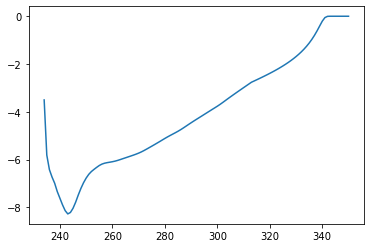

In [11]:
#df_lstm.set_index('idade', inplace=True)
fig, ax = plt.subplots()

df_lstm[df_lstm['t'].dt.year ==2000]['logqx_prob'].plot()
#df_lstm[df_lstm['t'].dt.year ==2018]['logqx_prob'].plot()

#df_lstm[df_lstm['ano'] in [2017,2018]]['logqx_prob'].plot()

In [12]:
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg


def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return pd.Series(diff)


def prepare_data(series, n_test, n_lag, n_seq):
    # extract raw values
    raw_values = series.values
    # transform data to be stationary
    diff_series = difference(raw_values, 1)
    diff_values = diff_series.values
    diff_values = diff_values.reshape(len(diff_values), 1)
    # rescale values to -1, 1
    #scaler = MinMaxScaler(feature_range=(-1, 1))
    scaler = MinMaxScaler(feature_range=(0, 1))
    #scaler = MinMaxScaler(feature_range=(0.05, 0.95))
    scaled_values = scaler.fit_transform(diff_values)
    scaled_values = scaled_values.reshape(len(scaled_values), 1)
    # transform into supervised learning problem X, y
    supervised = series_to_supervised(scaled_values, n_lag, n_seq)
    supervised_values = supervised.values
    # split into train and test sets
    train, test = supervised_values[0:-n_test], supervised_values[-n_test:]
    return scaler, train, test


def fit_lstm(train, n_lag, n_seq, n_batch, nb_epoch, n_neurons):
    # reshape training into [samples, timesteps, features]
    X, y = train[:, 0:n_lag], train[:, n_lag:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    # design network
    model = Sequential()
    model.add(LSTM(n_neurons, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(0.2))
    #model.add(Dense(y.shape[1]))
    #model.add(Dense(y.shape[1], activation='sigmoid', kernel_constraint=nonneg()))
    model.add(Dense(y.shape[1], activation='sigmoid'))
    #, activation='relu', kernel_constraint=unit_norm()
    model.compile(loss='mean_squared_error', optimizer='adam',metrics=["accuracy"])
    # fit network
    for i in range(nb_epoch):
        model.fit(X, y, epochs=1, batch_size=n_batch, verbose=1, shuffle=False)
        model.reset_states()
    return model


def forecast_lstm(model, X, n_batch):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, len(X))
    # make forecast
    forecast = model.predict(X, batch_size=n_batch)
    # convert to array
    return [x for x in forecast[0, :]]


def make_forecasts(model, n_batch, train, test, n_lag, n_seq):
    forecasts = list()
    for i in range(len(test)):
        X, y = test[i, 0:n_lag], test[i, n_lag:]
        # make forecast
        forecast = forecast_lstm(model, X, n_batch)
        # store the forecast
        forecasts.append(forecast)
    return forecasts


def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted


def inverse_transform(series, forecasts, scaler, n_test):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = np.array(forecasts[i])
        forecast = forecast.reshape(1, len(forecast))
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted


def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        print('t+%d RMSE: %f' % ((i+1), rmse))

        
def plot_forecasts(series, forecasts, n_test, idade):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.title('Idade =%i' %idade) # Título parametrizado com a idade
    plt.savefig(pasta_graficos + '/' + 'lstm_idade'+str(idade)+'.png')
    plt.show()
    

In [13]:
w_max = max(df_lstm['idade'])
print(w_max)

116


7/7 [==============================] - 0s 8ms/step - loss: 0.0428 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 5ms/step - loss: 0.0114 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 0.0036 - accuracy: 0.2857


7/7 [==============================] - 0s 5ms/step - loss: 0.0011 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 5ms/step - loss: 0.0011 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 5ms/step - loss: 8.8479e-04 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 4.6095e-04 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 4.1937e-04 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 5ms/step - loss: 4.0210e-04 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 21ms/step - loss: 3.8063e-04 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 3ms/step - loss: 3.2647e-04 - accuracy: 0.2857
t+1 RMSE: 0.007499
t+2 RMSE: 0.011487
t+3 RMSE: 0.160887
t+4 RMSE: 0.228288
t+5 RMSE: 0.277872
t+6 RMSE: 0.284563
t+7 RMSE: 0.295845
t+8 RMSE: 0.304769
t+9 RMSE: 0.312670
t+10 RMSE: 0.255931


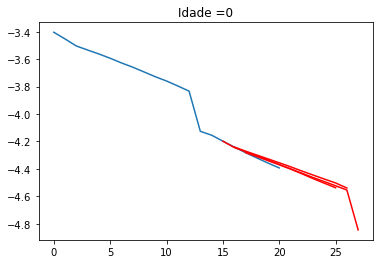

7/7 [==============================] - 0s 4ms/step - loss: 0.0309 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 3ms/step - loss: 0.0118 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0053 - accuracy: 0.1429


7/7 [==============================] - 0s 4ms/step - loss: 0.0034 - accuracy: 0.2857


7/7 [==============================] - 0s 4ms/step - loss: 0.0027 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0024 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0021 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0010 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 1.0000
t+1 RMSE: 0.063562
t+2 RMSE: 0.091116
t+3 RMSE: 0.405629
t+4 RMSE: 0.526794
t+5 RMSE: 0.614015
t+6 RMSE: 0.605308
t+7 RMSE: 0.618355
t+8 RMSE: 0.623395
t+9 RMSE: 0.628652
t+10 RMSE: 0.450550


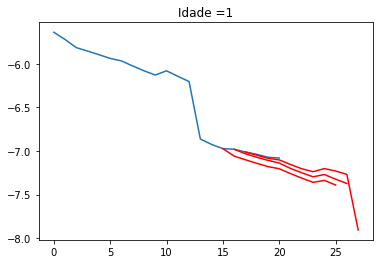

7/7 [==============================] - 0s 3ms/step - loss: 0.0441 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0153 - accuracy: 0.2857


7/7 [==============================] - 0s 4ms/step - loss: 0.0038 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 0.0018 - accuracy: 0.1429    


7/7 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0010 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.2857


7/7 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 0.0572 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.2857
t+1 RMSE: 0.025148
t+2 RMSE: 0.035292
t+3 RMSE: 0.261773
t+4 RMSE: 0.370482
t+5 RMSE: 0.434592
t+6 RMSE: 0.428356
t+7 RMSE: 0.427062
t+8 RMSE: 0.427558
t+9 RMSE: 0.430002
t+10 RMSE: 0.320025


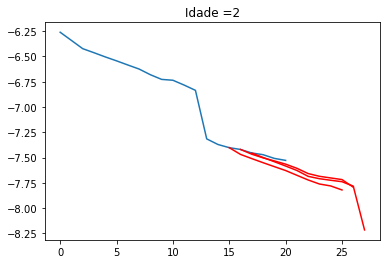

7/7 [==============================] - 0s 3ms/step - loss: 0.0441 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 0.0252 - accuracy: 0.4286


7/7 [==============================] - 0s 4ms/step - loss: 0.0084 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0038 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0027 - accuracy: 0.5714


7/7 [==============================] - 0s 4ms/step - loss: 0.0017 - accuracy: 0.5714


7/7 [==============================] - 0s 7ms/step - loss: 0.0021 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 0.5714
t+1 RMSE: 0.069463
t+2 RMSE: 0.072719
t+3 RMSE: 0.165772
t+4 RMSE: 0.286126
t+5 RMSE: 0.348734
t+6 RMSE: 0.327353
t+7 RMSE: 0.286909
t+8 RMSE: 0.246489
t+9 RMSE: 0.202186
t+10 RMSE: 0.250841


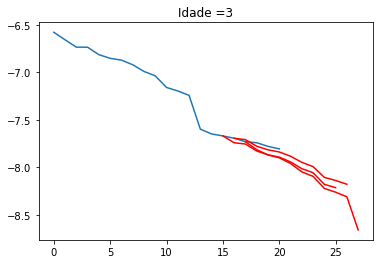

7/7 [==============================] - 0s 5ms/step - loss: 0.0452 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0211 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0042 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0040 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0038 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0030 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0026 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0029 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0018 - accuracy: 0.8571
t+1 RMSE: 0.070974
t+2 RMSE: 0.088764
t+3 RMSE: 0.133342
t+4 RMSE: 0.188834
t+5 RMSE: 0.231296
t+6 RMSE: 0.216635
t+7 RMSE: 0.182785
t+8 RMSE: 0.137720
t+9 RMSE: 0.081537
t+10 RMSE: 0.179667


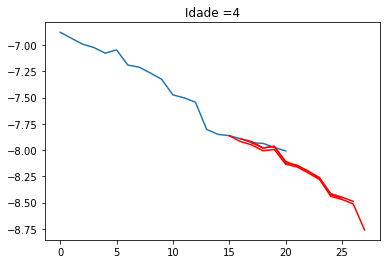

7/7 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 2ms/step - loss: 0.0112 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0052 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0026 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0022 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0026 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0027 - accuracy: 0.5714    


7/7 [==============================] - 0s 3ms/step - loss: 0.0021 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 0.5714
t+1 RMSE: 0.034985
t+2 RMSE: 0.053788
t+3 RMSE: 0.017280
t+4 RMSE: 0.033298
t+5 RMSE: 0.048923
t+6 RMSE: 0.047004
t+7 RMSE: 0.041029
t+8 RMSE: 0.045439
t+9 RMSE: 0.035525
t+10 RMSE: 0.109143


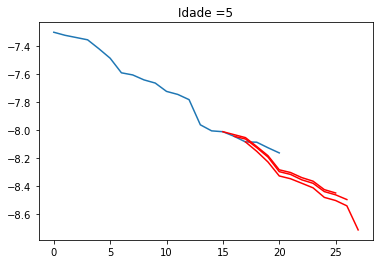

7/7 [==============================] - 0s 2ms/step - loss: 0.0527 - accuracy: 0.1429


7/7 [==============================] - 0s 4ms/step - loss: 0.0150 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0047 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0049 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0028 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0020 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0026 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0029 - accuracy: 1.0000
t+1 RMSE: 0.050490
t+2 RMSE: 0.048816
t+3 RMSE: 0.037499
t+4 RMSE: 0.031219
t+5 RMSE: 0.041448
t+6 RMSE: 0.035696
t+7 RMSE: 0.007803
t+8 RMSE: 0.018026
t+9 RMSE: 0.017045
t+10 RMSE: 0.050426


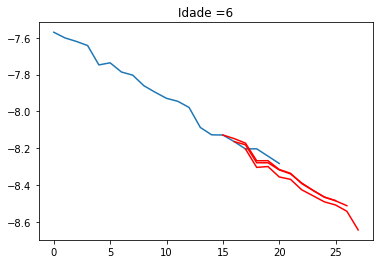

7/7 [==============================] - 0s 3ms/step - loss: 0.0502 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0083 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0034 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0032 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0033 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0020 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0019 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000
t+1 RMSE: 0.038520
t+2 RMSE: 0.051309
t+3 RMSE: 0.059610
t+4 RMSE: 0.082519
t+5 RMSE: 0.042040
t+6 RMSE: 0.036709
t+7 RMSE: 0.047074
t+8 RMSE: 0.031627
t+9 RMSE: 0.037560
t+10 RMSE: 0.052005


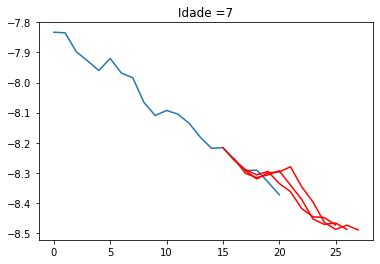

7/7 [==============================] - 0s 3ms/step - loss: 0.0206 - accuracy: 0.5714


7/7 [==============================] - 0s 4ms/step - loss: 0.0060 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0039 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0034 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0021 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0024 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0025 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000
t+1 RMSE: 0.080959
t+2 RMSE: 0.131981
t+3 RMSE: 0.141462
t+4 RMSE: 0.136940
t+5 RMSE: 0.093531
t+6 RMSE: 0.071502
t+7 RMSE: 0.059426
t+8 RMSE: 0.058366
t+9 RMSE: 0.075254
t+10 RMSE: 0.096007


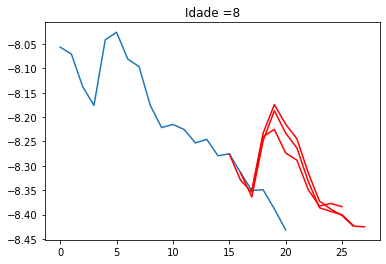

7/7 [==============================] - 0s 3ms/step - loss: 0.0123 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0030 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 7.3954e-04 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0016 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 6.1772e-04 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 7.9807e-04 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 6.1589e-04 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 7.0821e-04 - accuracy: 1.0000
t+1 RMSE: 0.146314
t+2 RMSE: 0.256033
t+3 RMSE: 0.279870
t+4 RMSE: 0.253242
t+5 RMSE: 0.199548
t+6 RMSE: 0.171871
t+7 RMSE: 0.148390
t+8 RMSE: 0.130648
t+9 RMSE: 0.131303
t+10 RMSE: 0.170577


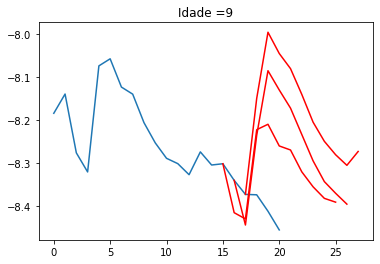

7/7 [==============================] - 0s 3ms/step - loss: 0.0163 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0037 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0024 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0013 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0024 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 7.0076e-04 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 8.7857e-04 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0011 - accuracy: 1.0000
t+1 RMSE: 0.114267
t+2 RMSE: 0.193881
t+3 RMSE: 0.204560
t+4 RMSE: 0.174683
t+5 RMSE: 0.111960
t+6 RMSE: 0.089681
t+7 RMSE: 0.059561
t+8 RMSE: 0.041323
t+9 RMSE: 0.035188
t+10 RMSE: 0.085558


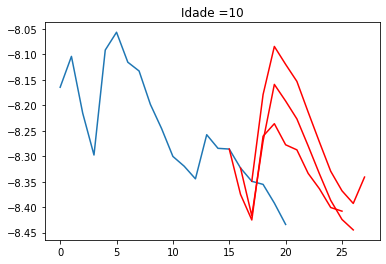

7/7 [==============================] - 0s 3ms/step - loss: 0.0171 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0044 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0039 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0036 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 1.0000


7/7 [==============================] - 0s 7ms/step - loss: 0.0015 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0010 - accuracy: 1.0000
t+1 RMSE: 0.074661
t+2 RMSE: 0.095791
t+3 RMSE: 0.089987
t+4 RMSE: 0.061561
t+5 RMSE: 0.045485
t+6 RMSE: 0.071889
t+7 RMSE: 0.107957
t+8 RMSE: 0.132492
t+9 RMSE: 0.133190
t+10 RMSE: 0.098093


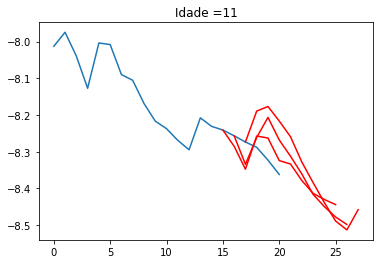

7/7 [==============================] - 0s 2ms/step - loss: 0.0387 - accuracy: 0.5714


7/7 [==============================] - 0s 4ms/step - loss: 0.0169 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0061 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0035 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0028 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0023 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0021 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0022 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.8571
t+1 RMSE: 0.034120
t+2 RMSE: 0.015521
t+3 RMSE: 0.104634
t+4 RMSE: 0.164494
t+5 RMSE: 0.210676
t+6 RMSE: 0.240958
t+7 RMSE: 0.267437
t+8 RMSE: 0.279150
t+9 RMSE: 0.281609
t+10 RMSE: 0.247617


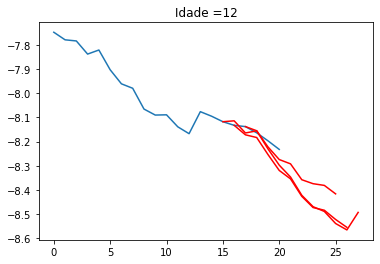

7/7 [==============================] - 0s 3ms/step - loss: 0.0185 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0066 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0051 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0024 - accuracy: 1.0000


7/7 [==============================] - 0s 5ms/step - loss: 0.0029 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0029 - accuracy: 1.0000


7/7 [==============================] - 0s 5ms/step - loss: 0.0019 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0021 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0018 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0023 - accuracy: 1.0000
t+1 RMSE: 0.034289
t+2 RMSE: 0.052468
t+3 RMSE: 0.093386
t+4 RMSE: 0.103864
t+5 RMSE: 0.099327
t+6 RMSE: 0.109642
t+7 RMSE: 0.155209
t+8 RMSE: 0.207519
t+9 RMSE: 0.234498
t+10 RMSE: 0.208206


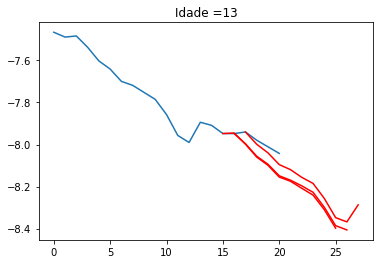

7/7 [==============================] - 0s 3ms/step - loss: 0.0257 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0080 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0033 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0033 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0024 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 0.8571


7/7 [==============================] - 0s 5ms/step - loss: 0.0022 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0023 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 1.0000
t+1 RMSE: 0.023792
t+2 RMSE: 0.016652
t+3 RMSE: 0.097133
t+4 RMSE: 0.143904
t+5 RMSE: 0.162876
t+6 RMSE: 0.150758
t+7 RMSE: 0.151059
t+8 RMSE: 0.161889
t+9 RMSE: 0.175673
t+10 RMSE: 0.147404


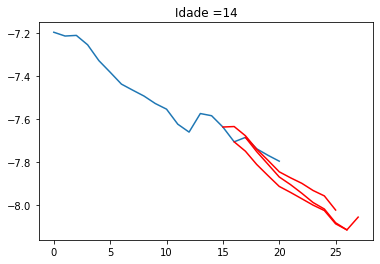

7/7 [==============================] - 0s 2ms/step - loss: 0.0251 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0095 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0051 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0027 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0026 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0017 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0018 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0018 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000
t+1 RMSE: 0.032992
t+2 RMSE: 0.031935
t+3 RMSE: 0.117436
t+4 RMSE: 0.157915
t+5 RMSE: 0.184963
t+6 RMSE: 0.181689
t+7 RMSE: 0.182089
t+8 RMSE: 0.184399
t+9 RMSE: 0.186504
t+10 RMSE: 0.145364


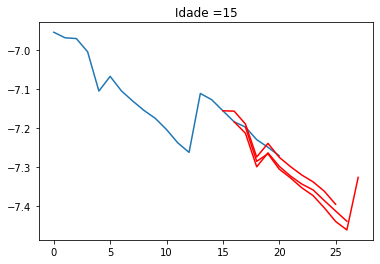

7/7 [==============================] - 0s 3ms/step - loss: 0.0423 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0187 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0049 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0019 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0019 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 8.7921e-04 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0019 - accuracy: 0.8571
t+1 RMSE: 0.013515
t+2 RMSE: 0.011675
t+3 RMSE: 0.116801
t+4 RMSE: 0.166610
t+5 RMSE: 0.196502
t+6 RMSE: 0.192736
t+7 RMSE: 0.191653
t+8 RMSE: 0.192173
t+9 RMSE: 0.194240
t+10 RMSE: 0.149215


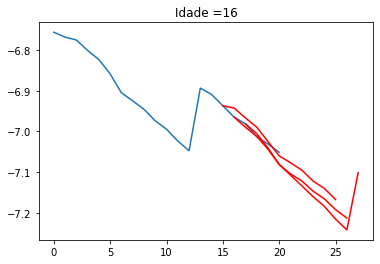

7/7 [==============================] - 0s 2ms/step - loss: 0.0483 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0139 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0040 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0025 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0029 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 8.9027e-04 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 9.1947e-04 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0015 - accuracy: 0.8571
t+1 RMSE: 0.011703
t+2 RMSE: 0.011741
t+3 RMSE: 0.111908
t+4 RMSE: 0.160121
t+5 RMSE: 0.188851
t+6 RMSE: 0.188445
t+7 RMSE: 0.185453
t+8 RMSE: 0.184609
t+9 RMSE: 0.183993
t+10 RMSE: 0.142988


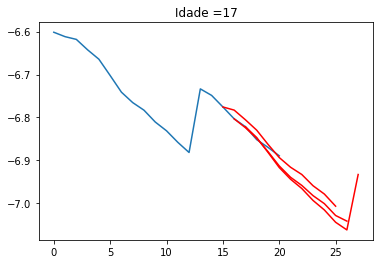

7/7 [==============================] - 0s 2ms/step - loss: 0.0503 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0153 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0088 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0029 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0021 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 0.7143    


7/7 [==============================] - 0s 4ms/step - loss: 0.0013 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0010 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0010 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 7.8370e-04 - accuracy: 0.7143
t+1 RMSE: 0.013898
t+2 RMSE: 0.014784
t+3 RMSE: 0.105193
t+4 RMSE: 0.148374
t+5 RMSE: 0.170617
t+6 RMSE: 0.172284
t+7 RMSE: 0.170538
t+8 RMSE: 0.168176
t+9 RMSE: 0.169567
t+10 RMSE: 0.130105


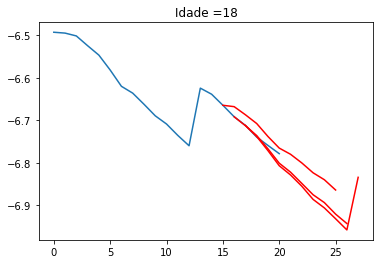

7/7 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.5714


7/7 [==============================] - 0s 4ms/step - loss: 0.0104 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0022 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0015 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 0.8571
t+1 RMSE: 0.013046
t+2 RMSE: 0.012274
t+3 RMSE: 0.093247
t+4 RMSE: 0.133283
t+5 RMSE: 0.153128
t+6 RMSE: 0.150811
t+7 RMSE: 0.148899
t+8 RMSE: 0.149140
t+9 RMSE: 0.151532
t+10 RMSE: 0.114515


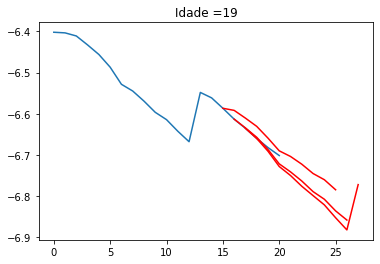

7/7 [==============================] - 0s 4ms/step - loss: 0.0426 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0164 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0055 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0028 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0028 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0021 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 9.2405e-04 - accuracy: 1.0000
t+1 RMSE: 0.011760
t+2 RMSE: 0.009415
t+3 RMSE: 0.083358
t+4 RMSE: 0.122589
t+5 RMSE: 0.143734
t+6 RMSE: 0.145819
t+7 RMSE: 0.141314
t+8 RMSE: 0.141366
t+9 RMSE: 0.143714
t+10 RMSE: 0.109483


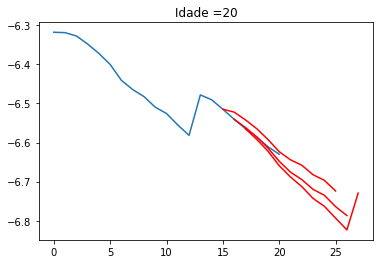

7/7 [==============================] - 0s 3ms/step - loss: 0.0447 - accuracy: 0.4286


7/7 [==============================] - 0s 5ms/step - loss: 0.0196 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0076 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0056 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0031 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 1.0000


7/7 [==============================] - ETA: 0s - loss: 0.0028 - accuracy: 1.00 - 0s 4ms/step - loss: 0.0025 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0025 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 1.0000
t+1 RMSE: 0.008248
t+2 RMSE: 0.014947
t+3 RMSE: 0.072061
t+4 RMSE: 0.099925
t+5 RMSE: 0.113119
t+6 RMSE: 0.114361
t+7 RMSE: 0.115025
t+8 RMSE: 0.115715
t+9 RMSE: 0.119029
t+10 RMSE: 0.091531


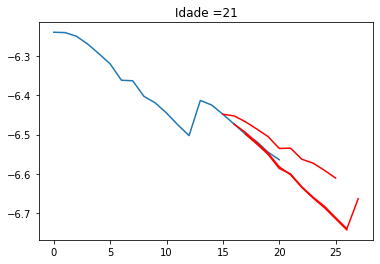

7/7 [==============================] - 0s 2ms/step - loss: 0.0412 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0172 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0083 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0042 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0024 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0027 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0017 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 1.0000
t+1 RMSE: 0.007534
t+2 RMSE: 0.014554
t+3 RMSE: 0.064115
t+4 RMSE: 0.091502
t+5 RMSE: 0.103032
t+6 RMSE: 0.107299
t+7 RMSE: 0.106667
t+8 RMSE: 0.109371
t+9 RMSE: 0.114377
t+10 RMSE: 0.090825


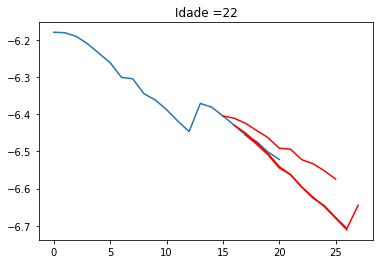

7/7 [==============================] - 0s 3ms/step - loss: 0.0372 - accuracy: 0.4286


7/7 [==============================] - 0s 4ms/step - loss: 0.0129 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0072 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0047 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0032 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0037 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0031 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0020 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0024 - accuracy: 1.0000
t+1 RMSE: 0.008255
t+2 RMSE: 0.014917
t+3 RMSE: 0.055073
t+4 RMSE: 0.079550
t+5 RMSE: 0.089866
t+6 RMSE: 0.091832
t+7 RMSE: 0.091345
t+8 RMSE: 0.093192
t+9 RMSE: 0.097821
t+10 RMSE: 0.079371


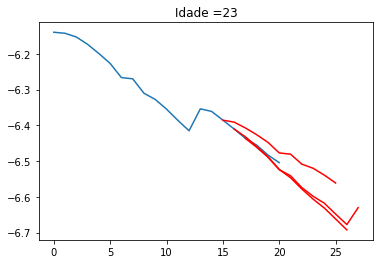

7/7 [==============================] - 0s 4ms/step - loss: 0.0263 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0159 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0052 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0031 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0035 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0052 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0017 - accuracy: 0.8571    


7/7 [==============================] - 0s 4ms/step - loss: 0.0015 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0024 - accuracy: 0.7143
t+1 RMSE: 0.009258
t+2 RMSE: 0.016395
t+3 RMSE: 0.046205
t+4 RMSE: 0.066460
t+5 RMSE: 0.074449
t+6 RMSE: 0.080076
t+7 RMSE: 0.079448
t+8 RMSE: 0.081049
t+9 RMSE: 0.085831
t+10 RMSE: 0.070188


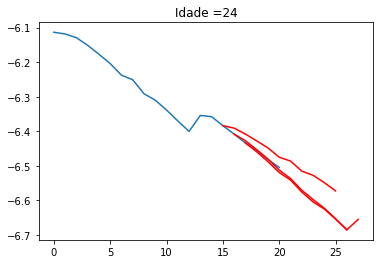

7/7 [==============================] - 0s 4ms/step - loss: 0.0229 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0080 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0024 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0024 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0018 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0017 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 1.0000
t+1 RMSE: 0.008022
t+2 RMSE: 0.014738
t+3 RMSE: 0.032023
t+4 RMSE: 0.050740
t+5 RMSE: 0.059391
t+6 RMSE: 0.067578
t+7 RMSE: 0.069402
t+8 RMSE: 0.069695
t+9 RMSE: 0.071592
t+10 RMSE: 0.061656


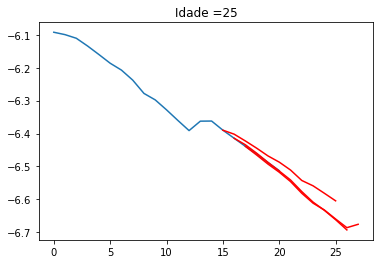

7/7 [==============================] - 0s 3ms/step - loss: 0.0266 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0070 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0062 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0031 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0028 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0024 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0024 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0020 - accuracy: 1.0000
t+1 RMSE: 0.011392
t+2 RMSE: 0.017770
t+3 RMSE: 0.025756
t+4 RMSE: 0.037150
t+5 RMSE: 0.042516
t+6 RMSE: 0.050543
t+7 RMSE: 0.054939
t+8 RMSE: 0.056884
t+9 RMSE: 0.061013
t+10 RMSE: 0.052508


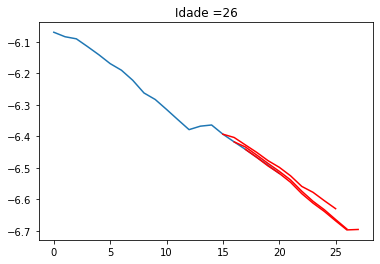

7/7 [==============================] - 0s 3ms/step - loss: 0.0304 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0122 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0025 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0030 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0027 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0046 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0026 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0020 - accuracy: 1.0000
t+1 RMSE: 0.014484
t+2 RMSE: 0.021793
t+3 RMSE: 0.024674
t+4 RMSE: 0.033204
t+5 RMSE: 0.035724
t+6 RMSE: 0.041175
t+7 RMSE: 0.046027
t+8 RMSE: 0.050604
t+9 RMSE: 0.056484
t+10 RMSE: 0.054352


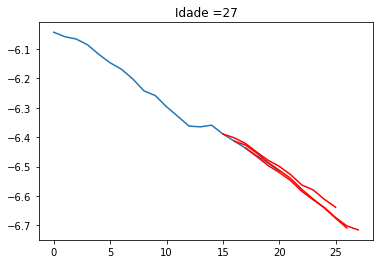

7/7 [==============================] - 0s 2ms/step - loss: 0.0224 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0066 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0055 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0040 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0028 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0025 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0021 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0020 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0020 - accuracy: 1.0000
t+1 RMSE: 0.009847
t+2 RMSE: 0.016517
t+3 RMSE: 0.020175
t+4 RMSE: 0.025945
t+5 RMSE: 0.027987
t+6 RMSE: 0.033986
t+7 RMSE: 0.038182
t+8 RMSE: 0.041849
t+9 RMSE: 0.047811
t+10 RMSE: 0.049910


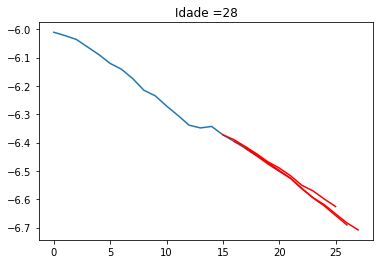

7/7 [==============================] - 0s 2ms/step - loss: 0.0219 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0066 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0055 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0035 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0033 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0018 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0032 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 1.0000
t+1 RMSE: 0.010179
t+2 RMSE: 0.016195
t+3 RMSE: 0.020207
t+4 RMSE: 0.025481
t+5 RMSE: 0.026126
t+6 RMSE: 0.034336
t+7 RMSE: 0.038128
t+8 RMSE: 0.043013
t+9 RMSE: 0.049421
t+10 RMSE: 0.053763


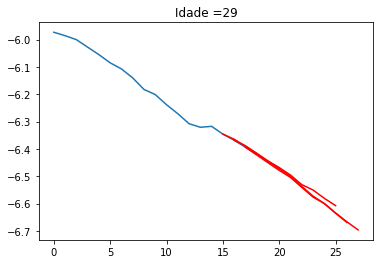

7/7 [==============================] - 0s 2ms/step - loss: 0.0222 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0070 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0036 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0025 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0021 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0016 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0015 - accuracy: 1.0000
t+1 RMSE: 0.007124
t+2 RMSE: 0.013391
t+3 RMSE: 0.016096
t+4 RMSE: 0.020714
t+5 RMSE: 0.023057
t+6 RMSE: 0.032917
t+7 RMSE: 0.039127
t+8 RMSE: 0.042456
t+9 RMSE: 0.046933
t+10 RMSE: 0.052725


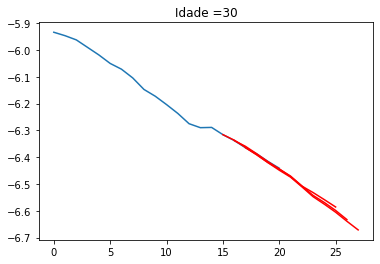

7/7 [==============================] - 0s 3ms/step - loss: 0.0261 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0087 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0056 - accuracy: 0.8571


7/7 [==============================] - 0s 5ms/step - loss: 0.0045 - accuracy: 1.0000


7/7 [==============================] - 0s 5ms/step - loss: 0.0024 - accuracy: 0.7143


7/7 [==============================] - 0s 6ms/step - loss: 0.0031 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0026 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0021 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0032 - accuracy: 0.8571
t+1 RMSE: 0.010516
t+2 RMSE: 0.016754
t+3 RMSE: 0.019819
t+4 RMSE: 0.024027
t+5 RMSE: 0.022850
t+6 RMSE: 0.028180
t+7 RMSE: 0.031873
t+8 RMSE: 0.038283
t+9 RMSE: 0.044496
t+10 RMSE: 0.050781


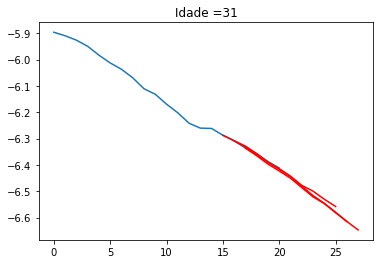

7/7 [==============================] - 0s 3ms/step - loss: 0.0195 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0087 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0044 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0040 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0040 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0027 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0017 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 0.8571
t+1 RMSE: 0.005968
t+2 RMSE: 0.012409
t+3 RMSE: 0.017303
t+4 RMSE: 0.020217
t+5 RMSE: 0.018525
t+6 RMSE: 0.022326
t+7 RMSE: 0.027373
t+8 RMSE: 0.032046
t+9 RMSE: 0.035680
t+10 RMSE: 0.043762


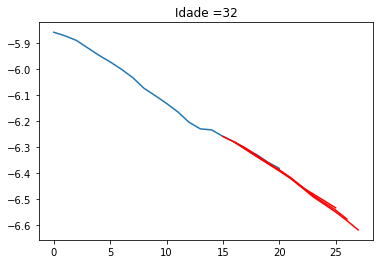

7/7 [==============================] - 0s 3ms/step - loss: 0.0271 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0097 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0060 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0030 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0033 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0024 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0017 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000
t+1 RMSE: 0.006370
t+2 RMSE: 0.013437
t+3 RMSE: 0.022392
t+4 RMSE: 0.025294
t+5 RMSE: 0.022119
t+6 RMSE: 0.013872
t+7 RMSE: 0.012836
t+8 RMSE: 0.017568
t+9 RMSE: 0.022551
t+10 RMSE: 0.031345


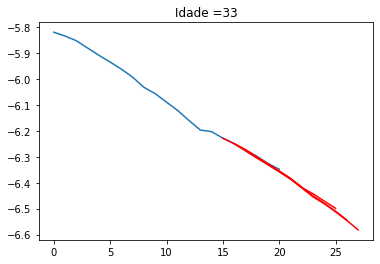

7/7 [==============================] - 0s 3ms/step - loss: 0.0377 - accuracy: 0.1429


7/7 [==============================] - 0s 4ms/step - loss: 0.0058 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0022 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0015 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 8.3561e-04 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 9.3789e-04 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 8.2958e-04 - accuracy: 1.0000
t+1 RMSE: 0.004808
t+2 RMSE: 0.010964
t+3 RMSE: 0.025279
t+4 RMSE: 0.027685
t+5 RMSE: 0.022993
t+6 RMSE: 0.009409
t+7 RMSE: 0.003333
t+8 RMSE: 0.008087
t+9 RMSE: 0.012932
t+10 RMSE: 0.026180


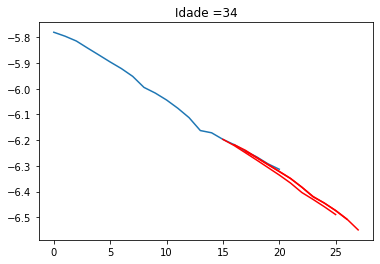

7/7 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 0.0189 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0060 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0031 - accuracy: 0.8571    


7/7 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0013 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0017 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 9.0901e-04 - accuracy: 1.0000
t+1 RMSE: 0.005381
t+2 RMSE: 0.009756
t+3 RMSE: 0.030591
t+4 RMSE: 0.038002
t+5 RMSE: 0.037138
t+6 RMSE: 0.025696
t+7 RMSE: 0.020629
t+8 RMSE: 0.017024
t+9 RMSE: 0.010335
t+10 RMSE: 0.024090


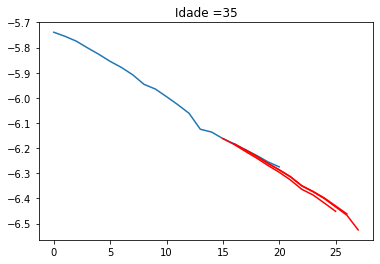

7/7 [==============================] - 0s 2ms/step - loss: 0.0392 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 5ms/step - loss: 0.0219 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0073 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0051 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0020 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 0.7143
t+1 RMSE: 0.004178
t+2 RMSE: 0.007079
t+3 RMSE: 0.036131
t+4 RMSE: 0.044497
t+5 RMSE: 0.047385
t+6 RMSE: 0.037187
t+7 RMSE: 0.032292
t+8 RMSE: 0.027732
t+9 RMSE: 0.022808
t+10 RMSE: 0.019930


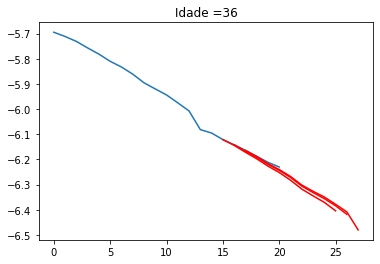

7/7 [==============================] - 0s 3ms/step - loss: 0.0413 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 5ms/step - loss: 0.0165 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 3ms/step - loss: 0.0063 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 0.0034 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 8.8301e-04 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 0.7143
t+1 RMSE: 0.006040
t+2 RMSE: 0.009387
t+3 RMSE: 0.040638
t+4 RMSE: 0.055876
t+5 RMSE: 0.060636
t+6 RMSE: 0.054624
t+7 RMSE: 0.051858
t+8 RMSE: 0.047705
t+9 RMSE: 0.040724
t+10 RMSE: 0.034543


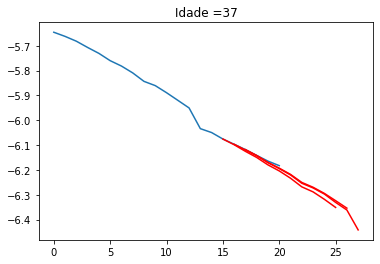

7/7 [==============================] - 0s 3ms/step - loss: 0.0383 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0196 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0031 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0024 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 0.5714


7/7 [==============================] - 0s 4ms/step - loss: 0.0013 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 7.6092e-04 - accuracy: 0.5714
t+1 RMSE: 0.004096
t+2 RMSE: 0.004686
t+3 RMSE: 0.043285
t+4 RMSE: 0.056923
t+5 RMSE: 0.066888
t+6 RMSE: 0.061979
t+7 RMSE: 0.058696
t+8 RMSE: 0.055835
t+9 RMSE: 0.051237
t+10 RMSE: 0.038461


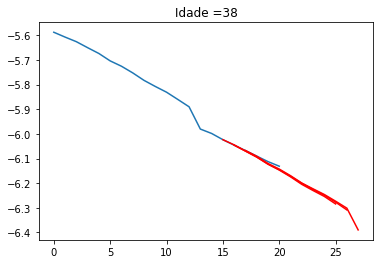

7/7 [==============================] - 0s 3ms/step - loss: 0.0428 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0147 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.5714
t+1 RMSE: 0.003061
t+2 RMSE: 0.004714
t+3 RMSE: 0.043420
t+4 RMSE: 0.059819
t+5 RMSE: 0.070792
t+6 RMSE: 0.067235
t+7 RMSE: 0.063637
t+8 RMSE: 0.059840
t+9 RMSE: 0.053824
t+10 RMSE: 0.044215


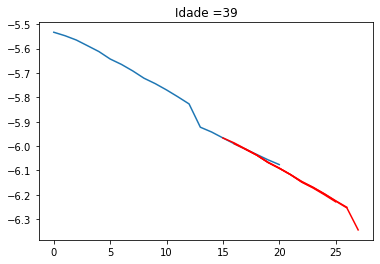

7/7 [==============================] - 0s 2ms/step - loss: 0.0311 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 2ms/step - loss: 0.0099 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0048 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0021 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 0.2857    


7/7 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 0.5714    


7/7 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 0.8571    


7/7 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 0.7143    
t+1 RMSE: 0.004839
t+2 RMSE: 0.006557
t+3 RMSE: 0.043076
t+4 RMSE: 0.063838
t+5 RMSE: 0.073895
t+6 RMSE: 0.071773
t+7 RMSE: 0.069860
t+8 RMSE: 0.068302
t+9 RMSE: 0.060649
t+10 RMSE: 0.051194


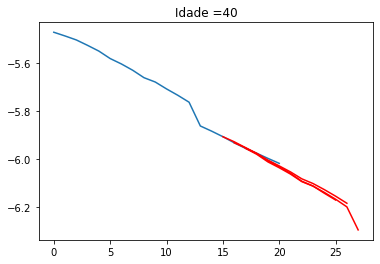

7/7 [==============================] - 0s 2ms/step - loss: 0.0387 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 2ms/step - loss: 0.0100 - accuracy: 0.5714


7/7 [==============================] - 0s 4ms/step - loss: 0.0054 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 0.5714


7/7 [==============================] - 0s 4ms/step - loss: 0.0016 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 9.8027e-04 - accuracy: 0.5714
t+1 RMSE: 0.004915
t+2 RMSE: 0.006159
t+3 RMSE: 0.045454
t+4 RMSE: 0.064380
t+5 RMSE: 0.079100
t+6 RMSE: 0.077058
t+7 RMSE: 0.075297
t+8 RMSE: 0.072437
t+9 RMSE: 0.067072
t+10 RMSE: 0.052075


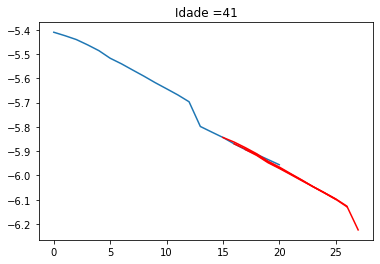

7/7 [==============================] - 0s 2ms/step - loss: 0.0434 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 2ms/step - loss: 0.0117 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0010 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 0.4286
t+1 RMSE: 0.005628
t+2 RMSE: 0.008637
t+3 RMSE: 0.045763
t+4 RMSE: 0.066857
t+5 RMSE: 0.083077
t+6 RMSE: 0.081798
t+7 RMSE: 0.080703
t+8 RMSE: 0.080057
t+9 RMSE: 0.074860
t+10 RMSE: 0.061390


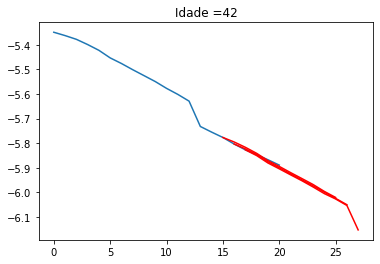

7/7 [==============================] - 0s 2ms/step - loss: 0.0323 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0137 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 0.7143


7/7 [==============================] - 0s 5ms/step - loss: 9.8454e-04 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.8571
t+1 RMSE: 0.005665
t+2 RMSE: 0.007083
t+3 RMSE: 0.046582
t+4 RMSE: 0.064950
t+5 RMSE: 0.081365
t+6 RMSE: 0.078715
t+7 RMSE: 0.077542
t+8 RMSE: 0.074370
t+9 RMSE: 0.070829
t+10 RMSE: 0.055825


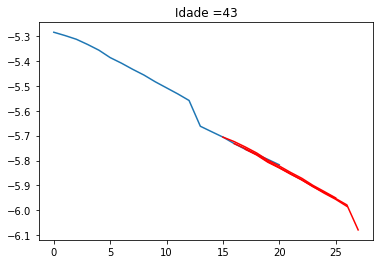

7/7 [==============================] - 0s 2ms/step - loss: 0.0345 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0097 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 8.7708e-04 - accuracy: 0.4286
t+1 RMSE: 0.005305
t+2 RMSE: 0.007988
t+3 RMSE: 0.047645
t+4 RMSE: 0.067552
t+5 RMSE: 0.083704
t+6 RMSE: 0.082134
t+7 RMSE: 0.080853
t+8 RMSE: 0.080045
t+9 RMSE: 0.076570
t+10 RMSE: 0.060683


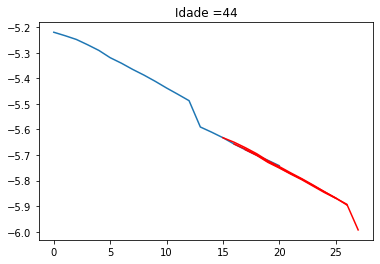

7/7 [==============================] - 0s 2ms/step - loss: 0.0382 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0199 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0031 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 6.4320e-04 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 9.0223e-04 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 7.7105e-04 - accuracy: 0.7143
t+1 RMSE: 0.005892
t+2 RMSE: 0.007005
t+3 RMSE: 0.049082
t+4 RMSE: 0.067102
t+5 RMSE: 0.084222
t+6 RMSE: 0.081218
t+7 RMSE: 0.080519
t+8 RMSE: 0.079478
t+9 RMSE: 0.076553
t+10 RMSE: 0.060331


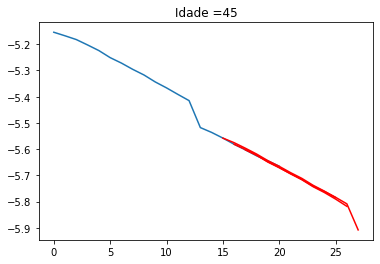

7/7 [==============================] - 0s 2ms/step - loss: 0.0414 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0076 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 9.4854e-04 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 9.0284e-04 - accuracy: 0.5714
t+1 RMSE: 0.006018
t+2 RMSE: 0.007040
t+3 RMSE: 0.049881
t+4 RMSE: 0.066606
t+5 RMSE: 0.083898
t+6 RMSE: 0.081360
t+7 RMSE: 0.080716
t+8 RMSE: 0.078995
t+9 RMSE: 0.077182
t+10 RMSE: 0.060320


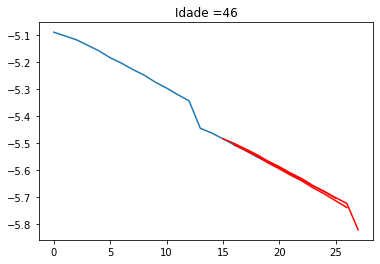

7/7 [==============================] - 0s 3ms/step - loss: 0.0384 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 3ms/step - loss: 0.0168 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0050 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0030 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 9.3072e-04 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 0.8571
t+1 RMSE: 0.005647
t+2 RMSE: 0.006460
t+3 RMSE: 0.047173
t+4 RMSE: 0.063112
t+5 RMSE: 0.079520
t+6 RMSE: 0.076297
t+7 RMSE: 0.075408
t+8 RMSE: 0.073633
t+9 RMSE: 0.072320
t+10 RMSE: 0.058280


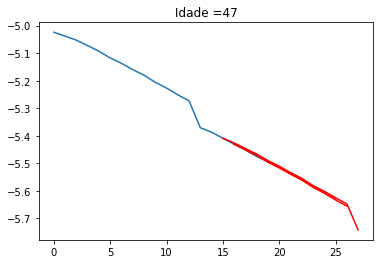

7/7 [==============================] - 0s 2ms/step - loss: 0.0451 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0106 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0011 - accuracy: 0.2857


7/7 [==============================] - 0s 4ms/step - loss: 0.0019 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0010 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 7.5874e-04 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 0.5714
t+1 RMSE: 0.004949
t+2 RMSE: 0.005228
t+3 RMSE: 0.041440
t+4 RMSE: 0.055786
t+5 RMSE: 0.070497
t+6 RMSE: 0.067841
t+7 RMSE: 0.067847
t+8 RMSE: 0.066531
t+9 RMSE: 0.065904
t+10 RMSE: 0.051747


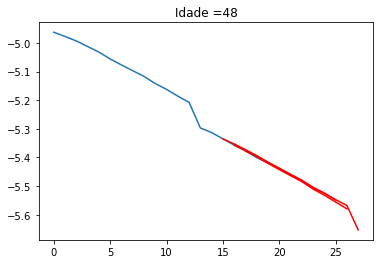

7/7 [==============================] - 0s 3ms/step - loss: 0.0441 - accuracy: 0.1429


7/7 [==============================] - 0s 4ms/step - loss: 0.0248 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0055 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 8.2834e-04 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 7.9460e-04 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 7.3944e-04 - accuracy: 0.7143
t+1 RMSE: 0.003910
t+2 RMSE: 0.006314
t+3 RMSE: 0.037006
t+4 RMSE: 0.051613
t+5 RMSE: 0.064658
t+6 RMSE: 0.064844
t+7 RMSE: 0.065930
t+8 RMSE: 0.065971
t+9 RMSE: 0.065423
t+10 RMSE: 0.053295


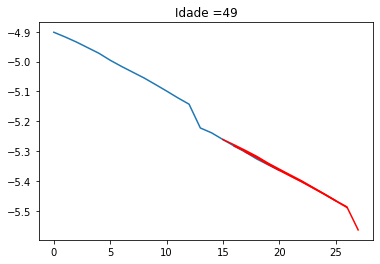

7/7 [==============================] - 0s 2ms/step - loss: 0.0491 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 2ms/step - loss: 0.0232 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 0.0049 - accuracy: 0.1429


7/7 [==============================] - 0s 4ms/step - loss: 0.0017 - accuracy: 0.2857    


7/7 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 0.2857    


7/7 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 8.5150e-04 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 8.5379e-04 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0028 - accuracy: 0.7143    
t+1 RMSE: 0.003239
t+2 RMSE: 0.004753
t+3 RMSE: 0.030639
t+4 RMSE: 0.042475
t+5 RMSE: 0.053839
t+6 RMSE: 0.054657
t+7 RMSE: 0.056131
t+8 RMSE: 0.056529
t+9 RMSE: 0.056727
t+10 RMSE: 0.047134


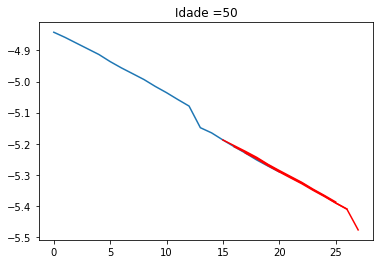

7/7 [==============================] - 0s 2ms/step - loss: 0.0430 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0095 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 0.4286


7/7 [==============================] - 0s 5ms/step - loss: 0.0011 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 7.5238e-04 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 0.7143
t+1 RMSE: 0.002984
t+2 RMSE: 0.003058
t+3 RMSE: 0.026682
t+4 RMSE: 0.036664
t+5 RMSE: 0.046947
t+6 RMSE: 0.047462
t+7 RMSE: 0.049264
t+8 RMSE: 0.049972
t+9 RMSE: 0.050533
t+10 RMSE: 0.041282


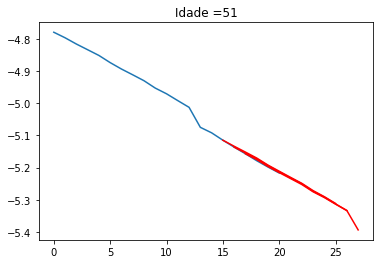

7/7 [==============================] - 0s 2ms/step - loss: 0.0572 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0190 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 9.4153e-04 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 9.0618e-04 - accuracy: 0.4286
t+1 RMSE: 0.002571
t+2 RMSE: 0.002541
t+3 RMSE: 0.025316
t+4 RMSE: 0.035083
t+5 RMSE: 0.045422
t+6 RMSE: 0.046952
t+7 RMSE: 0.049565
t+8 RMSE: 0.050807
t+9 RMSE: 0.052139
t+10 RMSE: 0.042905


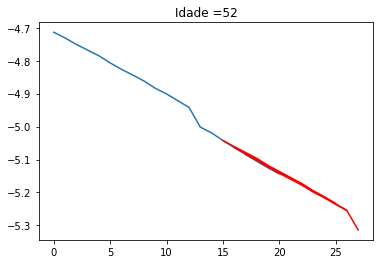

7/7 [==============================] - 0s 2ms/step - loss: 0.0455 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0136 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 0.4286


7/7 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 9.5425e-04 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 9.0695e-04 - accuracy: 0.5714


7/7 [==============================] - 0s 4ms/step - loss: 9.0519e-04 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 9.1560e-04 - accuracy: 0.7143
t+1 RMSE: 0.002208
t+2 RMSE: 0.002491
t+3 RMSE: 0.027796
t+4 RMSE: 0.039140
t+5 RMSE: 0.050178
t+6 RMSE: 0.052537
t+7 RMSE: 0.055702
t+8 RMSE: 0.057530
t+9 RMSE: 0.058512
t+10 RMSE: 0.048637


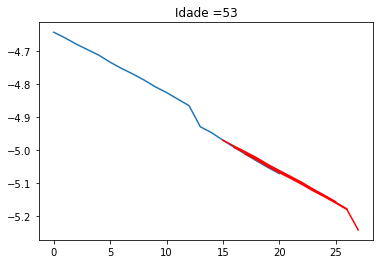

7/7 [==============================] - 0s 4ms/step - loss: 0.0447 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 2ms/step - loss: 0.0132 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 0.0024 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 8.9688e-04 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 0.4286    


7/7 [==============================] - 0s 2ms/step - loss: 7.0975e-04 - accuracy: 0.8571


7/7 [==============================] - 0s 5ms/step - loss: 5.1752e-04 - accuracy: 0.7143
t+1 RMSE: 0.002131
t+2 RMSE: 0.003078
t+3 RMSE: 0.032282
t+4 RMSE: 0.045987
t+5 RMSE: 0.058644
t+6 RMSE: 0.061717
t+7 RMSE: 0.065094
t+8 RMSE: 0.067369
t+9 RMSE: 0.069184
t+10 RMSE: 0.057643


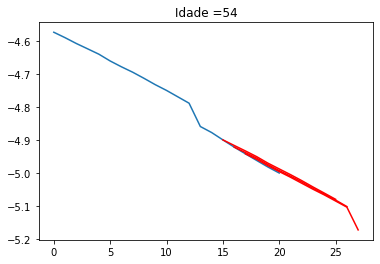

7/7 [==============================] - 0s 3ms/step - loss: 0.0372 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0153 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0056 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 8.1863e-04 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 9.9155e-04 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 7.8299e-04 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 6.4954e-04 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 7.1775e-04 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 4.4406e-04 - accuracy: 0.4286
t+1 RMSE: 0.002145
t+2 RMSE: 0.003687
t+3 RMSE: 0.036798
t+4 RMSE: 0.053699
t+5 RMSE: 0.067939
t+6 RMSE: 0.071527
t+7 RMSE: 0.075192
t+8 RMSE: 0.078239
t+9 RMSE: 0.080376
t+10 RMSE: 0.067843


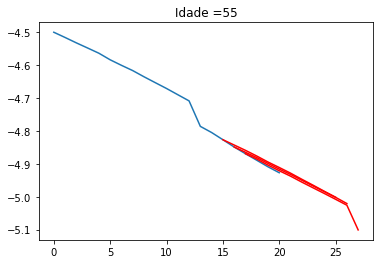

7/7 [==============================] - 0s 2ms/step - loss: 0.0483 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0136 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 0.1429


7/7 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.2857    


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.5714    


7/7 [==============================] - 0s 2ms/step - loss: 8.2456e-04 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 8.5070e-04 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 9.7748e-04 - accuracy: 0.5714


7/7 [==============================] - 0s 6ms/step - loss: 6.9912e-04 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 7.7800e-04 - accuracy: 0.8571
t+1 RMSE: 0.002268
t+2 RMSE: 0.004298
t+3 RMSE: 0.040636
t+4 RMSE: 0.059901
t+5 RMSE: 0.075138
t+6 RMSE: 0.078969
t+7 RMSE: 0.083060
t+8 RMSE: 0.086661
t+9 RMSE: 0.089311
t+10 RMSE: 0.076015


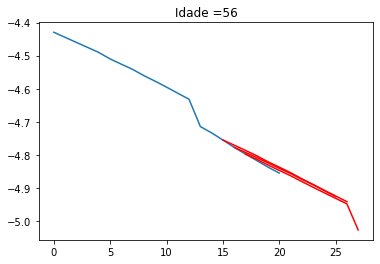

7/7 [==============================] - 0s 2ms/step - loss: 0.0532 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0164 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 7.2029e-04 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 6.9775e-04 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 4.3402e-04 - accuracy: 1.0000
t+1 RMSE: 0.002391
t+2 RMSE: 0.004178
t+3 RMSE: 0.043001
t+4 RMSE: 0.063510
t+5 RMSE: 0.079954
t+6 RMSE: 0.084371
t+7 RMSE: 0.088555
t+8 RMSE: 0.092204
t+9 RMSE: 0.094538
t+10 RMSE: 0.080061


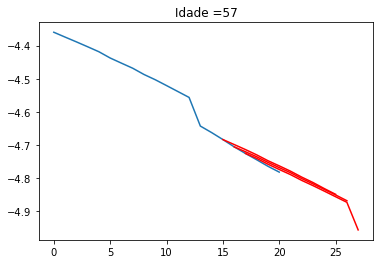

7/7 [==============================] - 0s 2ms/step - loss: 0.0432 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0132 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 7.5435e-04 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 0.2857    


7/7 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 5.3570e-04 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 6.8326e-04 - accuracy: 0.4286
t+1 RMSE: 0.002312
t+2 RMSE: 0.004196
t+3 RMSE: 0.045001
t+4 RMSE: 0.066580
t+5 RMSE: 0.083904
t+6 RMSE: 0.089458
t+7 RMSE: 0.093759
t+8 RMSE: 0.098118
t+9 RMSE: 0.099828
t+10 RMSE: 0.084026


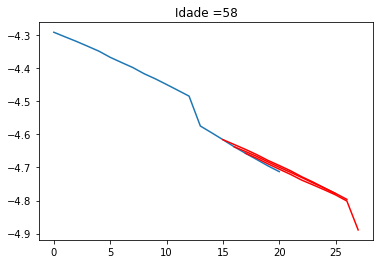

7/7 [==============================] - 0s 3ms/step - loss: 0.0430 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0104 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 0.2857


7/7 [==============================] - 0s 4ms/step - loss: 0.0023 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
t+1 RMSE: 0.002311
t+2 RMSE: 0.003930
t+3 RMSE: 0.046539
t+4 RMSE: 0.069758
t+5 RMSE: 0.087625
t+6 RMSE: 0.092461
t+7 RMSE: 0.096537
t+8 RMSE: 0.099971
t+9 RMSE: 0.102355
t+10 RMSE: 0.085672


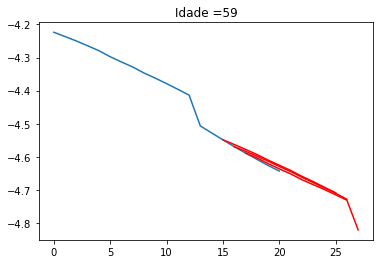

7/7 [==============================] - 0s 2ms/step - loss: 0.0341 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0131 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0032 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 8.9885e-04 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 8.9538e-04 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 5.9490e-04 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 7.9278e-04 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 5.3585e-04 - accuracy: 0.8571
t+1 RMSE: 0.002138
t+2 RMSE: 0.003635
t+3 RMSE: 0.048202
t+4 RMSE: 0.071619
t+5 RMSE: 0.090240
t+6 RMSE: 0.095635
t+7 RMSE: 0.099212
t+8 RMSE: 0.102355
t+9 RMSE: 0.105679
t+10 RMSE: 0.088653


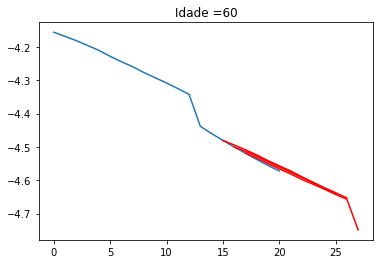

7/7 [==============================] - 0s 2ms/step - loss: 0.0432 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0215 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0048 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0021 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 9.4245e-04 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 9.6111e-04 - accuracy: 0.5714
t+1 RMSE: 0.001583
t+2 RMSE: 0.002585
t+3 RMSE: 0.047699
t+4 RMSE: 0.071490
t+5 RMSE: 0.090081
t+6 RMSE: 0.094692
t+7 RMSE: 0.098017
t+8 RMSE: 0.101246
t+9 RMSE: 0.103282
t+10 RMSE: 0.085499


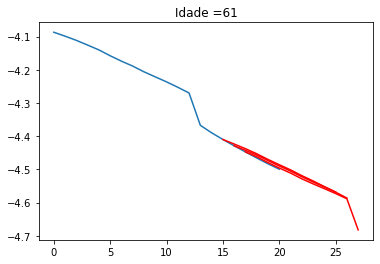

7/7 [==============================] - 0s 2ms/step - loss: 0.0456 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0143 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 0.4286


7/7 [==============================] - 0s 4ms/step - loss: 7.3774e-04 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 0.4286    


7/7 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 9.2420e-04 - accuracy: 0.4286
t+1 RMSE: 0.001783
t+2 RMSE: 0.003010
t+3 RMSE: 0.048088
t+4 RMSE: 0.071817
t+5 RMSE: 0.091047
t+6 RMSE: 0.096569
t+7 RMSE: 0.099761
t+8 RMSE: 0.103460
t+9 RMSE: 0.105477
t+10 RMSE: 0.088297


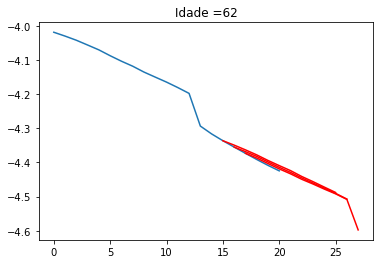

7/7 [==============================] - 0s 3ms/step - loss: 0.0392 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0145 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 0.1429    


7/7 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 8.4907e-04 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 9.5066e-04 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.1429
t+1 RMSE: 0.001902
t+2 RMSE: 0.003189
t+3 RMSE: 0.045328
t+4 RMSE: 0.068467
t+5 RMSE: 0.086676
t+6 RMSE: 0.092689
t+7 RMSE: 0.096830
t+8 RMSE: 0.100940
t+9 RMSE: 0.103462
t+10 RMSE: 0.085379


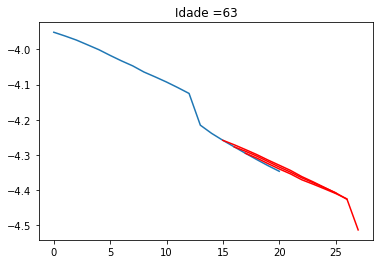

7/7 [==============================] - 0s 3ms/step - loss: 0.0354 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0104 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 0.2857


7/7 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 0.2857


7/7 [==============================] - 0s 4ms/step - loss: 0.0025 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 8.2811e-04 - accuracy: 0.4286
t+1 RMSE: 0.001930
t+2 RMSE: 0.003810
t+3 RMSE: 0.042047
t+4 RMSE: 0.064393
t+5 RMSE: 0.081127
t+6 RMSE: 0.086011
t+7 RMSE: 0.089769
t+8 RMSE: 0.093543
t+9 RMSE: 0.096386
t+10 RMSE: 0.081584


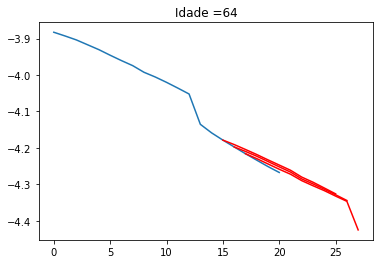

7/7 [==============================] - 0s 2ms/step - loss: 0.0374 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0111 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0024 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 8.4302e-04 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 9.6428e-04 - accuracy: 0.8571
t+1 RMSE: 0.002594
t+2 RMSE: 0.004772
t+3 RMSE: 0.038371
t+4 RMSE: 0.059831
t+5 RMSE: 0.075592
t+6 RMSE: 0.082823
t+7 RMSE: 0.086351
t+8 RMSE: 0.090248
t+9 RMSE: 0.092808
t+10 RMSE: 0.080634


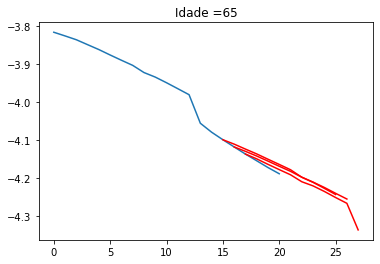

7/7 [==============================] - 0s 2ms/step - loss: 0.0348 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0128 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0020 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0027 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 7.8168e-04 - accuracy: 1.0000
t+1 RMSE: 0.002549
t+2 RMSE: 0.004889
t+3 RMSE: 0.034957
t+4 RMSE: 0.054982
t+5 RMSE: 0.069182
t+6 RMSE: 0.076119
t+7 RMSE: 0.080324
t+8 RMSE: 0.084614
t+9 RMSE: 0.086936
t+10 RMSE: 0.075084


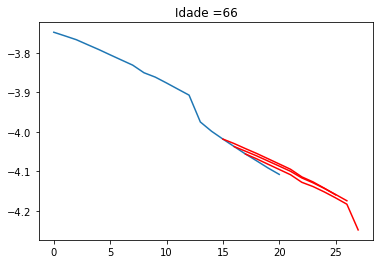

7/7 [==============================] - 0s 3ms/step - loss: 0.0333 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0112 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 0.8571
t+1 RMSE: 0.002554
t+2 RMSE: 0.005166
t+3 RMSE: 0.033133
t+4 RMSE: 0.052504
t+5 RMSE: 0.066101
t+6 RMSE: 0.073079
t+7 RMSE: 0.077099
t+8 RMSE: 0.081901
t+9 RMSE: 0.084948
t+10 RMSE: 0.073593


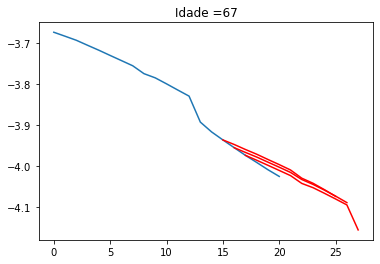

7/7 [==============================] - 0s 2ms/step - loss: 0.0347 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0141 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0039 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0028 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 0.4286    


7/7 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 0.7143    


7/7 [==============================] - 0s 4ms/step - loss: 0.0030 - accuracy: 0.8571    


7/7 [==============================] - 0s 3ms/step - loss: 0.0026 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 0.8571    


7/7 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 0.8571    
t+1 RMSE: 0.002343
t+2 RMSE: 0.004239
t+3 RMSE: 0.031531
t+4 RMSE: 0.050715
t+5 RMSE: 0.063295
t+6 RMSE: 0.070643
t+7 RMSE: 0.075111
t+8 RMSE: 0.079771
t+9 RMSE: 0.083216
t+10 RMSE: 0.073151


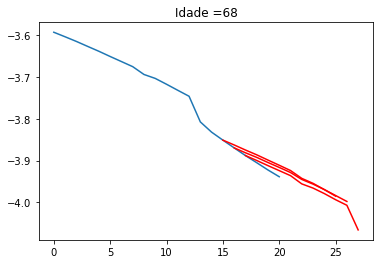

7/7 [==============================] - 0s 2ms/step - loss: 0.0299 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0073 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0020 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.5714    


7/7 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 0.8571
t+1 RMSE: 0.002702
t+2 RMSE: 0.003691
t+3 RMSE: 0.030892
t+4 RMSE: 0.050405
t+5 RMSE: 0.063500
t+6 RMSE: 0.071044
t+7 RMSE: 0.076094
t+8 RMSE: 0.081562
t+9 RMSE: 0.085518
t+10 RMSE: 0.075755


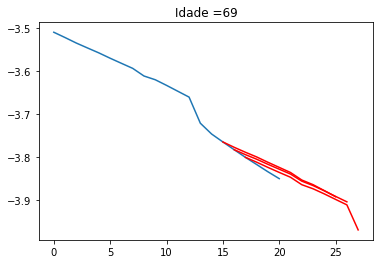

7/7 [==============================] - 0s 3ms/step - loss: 0.0338 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0107 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0020 - accuracy: 0.5714    


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 0.7143    


7/7 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000
t+1 RMSE: 0.003661
t+2 RMSE: 0.003943
t+3 RMSE: 0.029930
t+4 RMSE: 0.049649
t+5 RMSE: 0.061827
t+6 RMSE: 0.069869
t+7 RMSE: 0.074906
t+8 RMSE: 0.079860
t+9 RMSE: 0.084506
t+10 RMSE: 0.075218


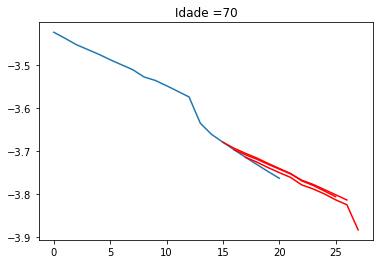

7/7 [==============================] - 0s 3ms/step - loss: 0.0335 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0142 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0071 - accuracy: 0.4286


7/7 [==============================] - 0s 4ms/step - loss: 0.0028 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
t+1 RMSE: 0.004645
t+2 RMSE: 0.004757
t+3 RMSE: 0.029758
t+4 RMSE: 0.049644
t+5 RMSE: 0.061947
t+6 RMSE: 0.071345
t+7 RMSE: 0.077198
t+8 RMSE: 0.083163
t+9 RMSE: 0.087910
t+10 RMSE: 0.078892


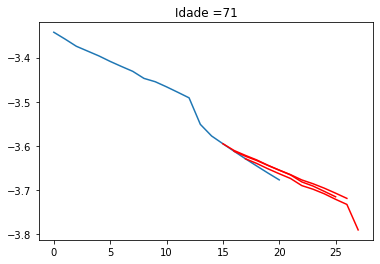

7/7 [==============================] - 0s 2ms/step - loss: 0.0274 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0081 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0035 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.8571
t+1 RMSE: 0.005608
t+2 RMSE: 0.005603
t+3 RMSE: 0.028210
t+4 RMSE: 0.047406
t+5 RMSE: 0.058718
t+6 RMSE: 0.067747
t+7 RMSE: 0.073907
t+8 RMSE: 0.080392
t+9 RMSE: 0.085375
t+10 RMSE: 0.076394


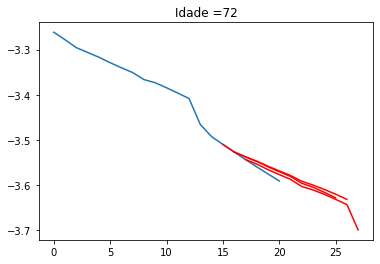

7/7 [==============================] - 0s 2ms/step - loss: 0.0304 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0088 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0035 - accuracy: 0.2857


7/7 [==============================] - 0s 4ms/step - loss: 0.0023 - accuracy: 0.5714


7/7 [==============================] - 0s 4ms/step - loss: 0.0019 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0016 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 0.8571
t+1 RMSE: 0.006298
t+2 RMSE: 0.006079
t+3 RMSE: 0.027069
t+4 RMSE: 0.045678
t+5 RMSE: 0.056910
t+6 RMSE: 0.065906
t+7 RMSE: 0.072317
t+8 RMSE: 0.078837
t+9 RMSE: 0.084005
t+10 RMSE: 0.076302


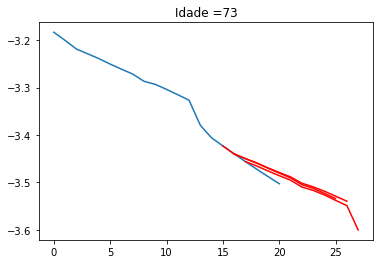

7/7 [==============================] - 0s 2ms/step - loss: 0.0251 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0119 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0042 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0045 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0026 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000
t+1 RMSE: 0.007177
t+2 RMSE: 0.006841
t+3 RMSE: 0.023345
t+4 RMSE: 0.040063
t+5 RMSE: 0.049230
t+6 RMSE: 0.058178
t+7 RMSE: 0.065091
t+8 RMSE: 0.072547
t+9 RMSE: 0.078026
t+10 RMSE: 0.071797


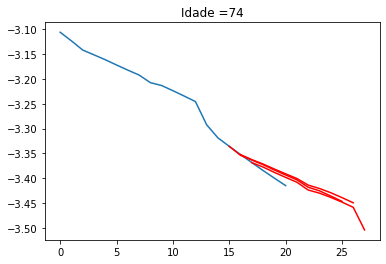

7/7 [==============================] - 0s 2ms/step - loss: 0.0270 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0114 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0053 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0025 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0033 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 1.0000
t+1 RMSE: 0.007712
t+2 RMSE: 0.007453
t+3 RMSE: 0.020951
t+4 RMSE: 0.036358
t+5 RMSE: 0.045257
t+6 RMSE: 0.054386
t+7 RMSE: 0.061231
t+8 RMSE: 0.068688
t+9 RMSE: 0.074050
t+10 RMSE: 0.069262


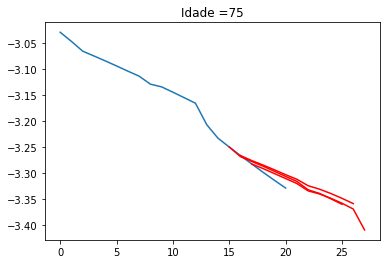

7/7 [==============================] - 0s 3ms/step - loss: 0.0226 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 2ms/step - loss: 0.0100 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0058 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 1.0000


7/7 [==============================] - 0s 1ms/step - loss: 0.0028 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0021 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000
t+1 RMSE: 0.008204
t+2 RMSE: 0.007828
t+3 RMSE: 0.018457
t+4 RMSE: 0.032712
t+5 RMSE: 0.040204
t+6 RMSE: 0.049562
t+7 RMSE: 0.057029
t+8 RMSE: 0.064808
t+9 RMSE: 0.071091
t+10 RMSE: 0.068191


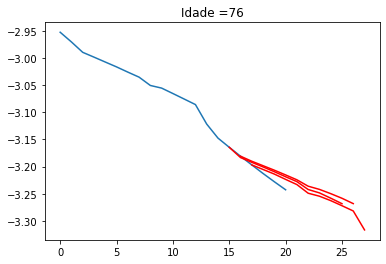

7/7 [==============================] - 0s 3ms/step - loss: 0.0242 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 2ms/step - loss: 0.0111 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0039 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0033 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 1.0000
t+1 RMSE: 0.008587
t+2 RMSE: 0.008008
t+3 RMSE: 0.015785
t+4 RMSE: 0.029129
t+5 RMSE: 0.036505
t+6 RMSE: 0.045362
t+7 RMSE: 0.052853
t+8 RMSE: 0.060319
t+9 RMSE: 0.066509
t+10 RMSE: 0.065680


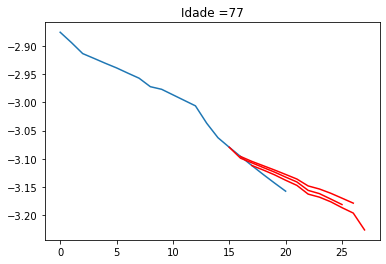

7/7 [==============================] - 0s 2ms/step - loss: 0.0272 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0121 - accuracy: 0.4286


7/7 [==============================] - 0s 4ms/step - loss: 0.0081 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0047 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0027 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0035 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0032 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 1.0000
t+1 RMSE: 0.009054
t+2 RMSE: 0.008414
t+3 RMSE: 0.014028
t+4 RMSE: 0.025310
t+5 RMSE: 0.032394
t+6 RMSE: 0.040561
t+7 RMSE: 0.048214
t+8 RMSE: 0.055566
t+9 RMSE: 0.060663
t+10 RMSE: 0.060763


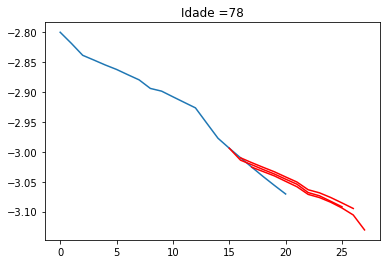

7/7 [==============================] - 0s 3ms/step - loss: 0.0194 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0090 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0067 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0034 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0021 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0025 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0021 - accuracy: 1.0000
t+1 RMSE: 0.009198
t+2 RMSE: 0.008320
t+3 RMSE: 0.011836
t+4 RMSE: 0.021937
t+5 RMSE: 0.029160
t+6 RMSE: 0.037056
t+7 RMSE: 0.044041
t+8 RMSE: 0.050824
t+9 RMSE: 0.056532
t+10 RMSE: 0.057592


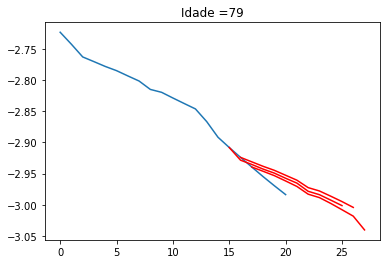

7/7 [==============================] - 0s 3ms/step - loss: 0.0255 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0133 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0097 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0064 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 4.0413e-04 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 6.2651e-04 - accuracy: 1.0000
t+1 RMSE: 0.008800
t+2 RMSE: 0.008312
t+3 RMSE: 0.011296
t+4 RMSE: 0.010706
t+5 RMSE: 0.020165
t+6 RMSE: 0.018975
t+7 RMSE: 0.024591
t+8 RMSE: 0.030900
t+9 RMSE: 0.040010
t+10 RMSE: 0.050831


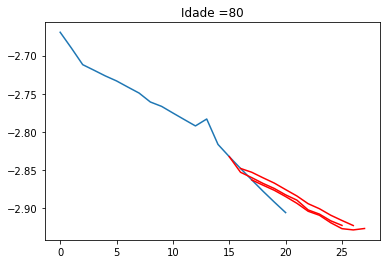

7/7 [==============================] - 0s 2ms/step - loss: 0.0293 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0240 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0163 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0349 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0122 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0085 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0160 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0082 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.7143
t+1 RMSE: 0.005909
t+2 RMSE: 0.005351
t+3 RMSE: 0.024742
t+4 RMSE: 0.024832
t+5 RMSE: 0.029452
t+6 RMSE: 0.009732
t+7 RMSE: 0.012548
t+8 RMSE: 0.020748
t+9 RMSE: 0.023233
t+10 RMSE: 0.040562


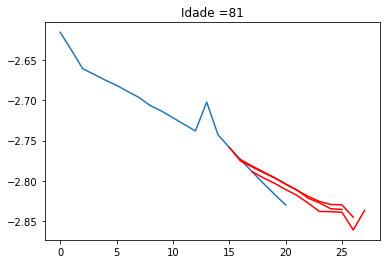

7/7 [==============================] - 0s 3ms/step - loss: 0.0317 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0260 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0333 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0124 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0041 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0054 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 7.0579e-04 - accuracy: 0.7143
t+1 RMSE: 0.008188
t+2 RMSE: 0.007908
t+3 RMSE: 0.037284
t+4 RMSE: 0.040409
t+5 RMSE: 0.048732
t+6 RMSE: 0.026548
t+7 RMSE: 0.019996
t+8 RMSE: 0.018252
t+9 RMSE: 0.016691
t+10 RMSE: 0.050880


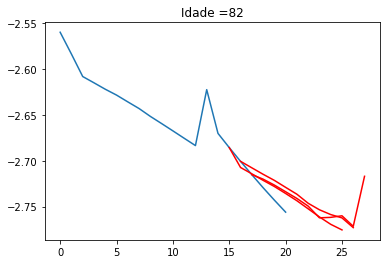

7/7 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0306 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0256 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0205 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0125 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0074 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0028 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0016 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 8.4224e-04 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 6.6222e-04 - accuracy: 0.7143
t+1 RMSE: 0.008555
t+2 RMSE: 0.008366
t+3 RMSE: 0.049434
t+4 RMSE: 0.057614
t+5 RMSE: 0.066617
t+6 RMSE: 0.042086
t+7 RMSE: 0.034334
t+8 RMSE: 0.028831
t+9 RMSE: 0.023621
t+10 RMSE: 0.053256


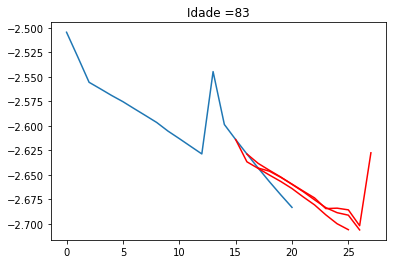

7/7 [==============================] - 0s 4ms/step - loss: 0.0332 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0302 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0217 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0091 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0062 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0027 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0010 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 0.8571    


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 8.3456e-04 - accuracy: 0.7143
t+1 RMSE: 0.007638
t+2 RMSE: 0.007901
t+3 RMSE: 0.062434
t+4 RMSE: 0.072433
t+5 RMSE: 0.084147
t+6 RMSE: 0.057391
t+7 RMSE: 0.046140
t+8 RMSE: 0.040440
t+9 RMSE: 0.036221
t+10 RMSE: 0.062485


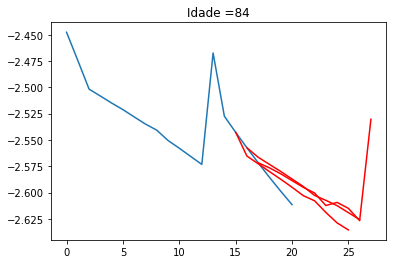

7/7 [==============================] - 0s 3ms/step - loss: 0.0333 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0322 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0239 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0182 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0121 - accuracy: 0.7143    


7/7 [==============================] - 0s 7ms/step - loss: 0.0103 - accuracy: 0.7143    


7/7 [==============================] - 0s 4ms/step - loss: 0.0036 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0037 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0017 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 8.6382e-04 - accuracy: 0.8571


7/7 [==============================] - 0s 5ms/step - loss: 8.6094e-04 - accuracy: 0.8571
t+1 RMSE: 0.008040
t+2 RMSE: 0.008347
t+3 RMSE: 0.074398
t+4 RMSE: 0.089721
t+5 RMSE: 0.102453
t+6 RMSE: 0.074255
t+7 RMSE: 0.065788
t+8 RMSE: 0.058803
t+9 RMSE: 0.051985
t+10 RMSE: 0.069702


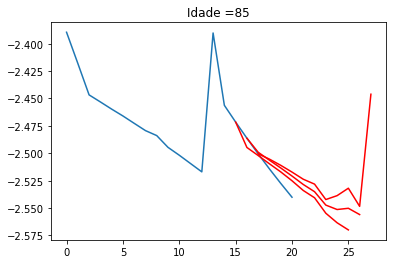

7/7 [==============================] - 0s 6ms/step - loss: 0.0350 - accuracy: 0.2857


7/7 [==============================] - 0s 4ms/step - loss: 0.0276 - accuracy: 0.2857


7/7 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.2857


7/7 [==============================] - 0s 4ms/step - loss: 0.0106 - accuracy: 0.7143    


7/7 [==============================] - 0s 4ms/step - loss: 0.0051 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0398 - accuracy: 0.2857    


7/7 [==============================] - 0s 4ms/step - loss: 0.0026 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0026 - accuracy: 0.8571


7/7 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 7.6980e-04 - accuracy: 0.8571
t+1 RMSE: 0.007474
t+2 RMSE: 0.008035
t+3 RMSE: 0.085422
t+4 RMSE: 0.103601
t+5 RMSE: 0.117780
t+6 RMSE: 0.088724
t+7 RMSE: 0.077743
t+8 RMSE: 0.070831
t+9 RMSE: 0.062092
t+10 RMSE: 0.075328


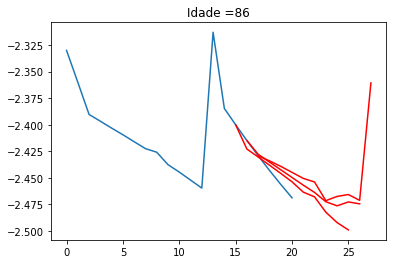

7/7 [==============================] - 0s 2ms/step - loss: 0.0333 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0297 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0225 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0126 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0071 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0078 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0035 - accuracy: 0.7143    


7/7 [==============================] - 0s 4ms/step - loss: 0.0031 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 0.8571    


7/7 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 0.8571
t+1 RMSE: 0.009407
t+2 RMSE: 0.010712
t+3 RMSE: 0.095055
t+4 RMSE: 0.117751
t+5 RMSE: 0.135936
t+6 RMSE: 0.103474
t+7 RMSE: 0.095649
t+8 RMSE: 0.088207
t+9 RMSE: 0.077413
t+10 RMSE: 0.099271


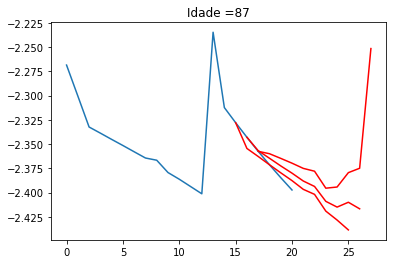

7/7 [==============================] - 0s 2ms/step - loss: 0.0342 - accuracy: 0.2857


7/7 [==============================] - 0s 10ms/step - loss: 0.0299 - accuracy: 0.4286


7/7 [==============================] - 0s 4ms/step - loss: 0.0191 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0082 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0033 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0026 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0014 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 0.8571
t+1 RMSE: 0.008906
t+2 RMSE: 0.009325
t+3 RMSE: 0.106516
t+4 RMSE: 0.128656
t+5 RMSE: 0.147457
t+6 RMSE: 0.117082
t+7 RMSE: 0.100801
t+8 RMSE: 0.093172
t+9 RMSE: 0.087962
t+10 RMSE: 0.096672


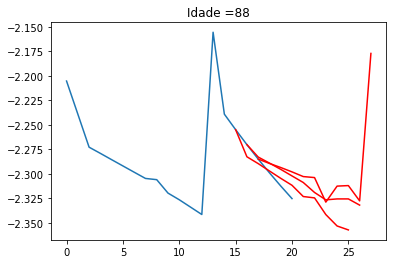

7/7 [==============================] - 0s 2ms/step - loss: 0.0349 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0288 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0227 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0120 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0075 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0045 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0037 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 0.8571    


7/7 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 0.8571
t+1 RMSE: 0.008596
t+2 RMSE: 0.009194
t+3 RMSE: 0.118961
t+4 RMSE: 0.144047
t+5 RMSE: 0.164535
t+6 RMSE: 0.130000
t+7 RMSE: 0.119310
t+8 RMSE: 0.106640
t+9 RMSE: 0.099907
t+10 RMSE: 0.105326


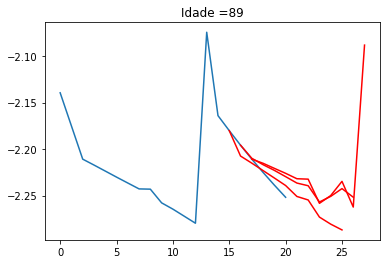

7/7 [==============================] - 0s 3ms/step - loss: 0.0378 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0328 - accuracy: 0.4286


7/7 [==============================] - 0s 4ms/step - loss: 0.0193 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0096 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0470 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0033 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0031 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0021 - accuracy: 0.8571    


7/7 [==============================] - 0s 2ms/step - loss: 9.5927e-04 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 8.1356e-04 - accuracy: 0.8571
t+1 RMSE: 0.008342
t+2 RMSE: 0.009318
t+3 RMSE: 0.130865
t+4 RMSE: 0.156783
t+5 RMSE: 0.180419
t+6 RMSE: 0.143443
t+7 RMSE: 0.135280
t+8 RMSE: 0.124829
t+9 RMSE: 0.123243
t+10 RMSE: 0.120902


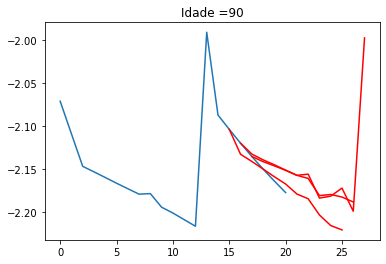

7/7 [==============================] - 0s 3ms/step - loss: 0.0354 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0339 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0246 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0153 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0060 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0030 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0041 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0020 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 7.0525e-04 - accuracy: 0.8571
t+1 RMSE: 0.011056
t+2 RMSE: 0.013497
t+3 RMSE: 0.142397
t+4 RMSE: 0.176624
t+5 RMSE: 0.204896
t+6 RMSE: 0.164002
t+7 RMSE: 0.149564
t+8 RMSE: 0.145095
t+9 RMSE: 0.139035
t+10 RMSE: 0.139389


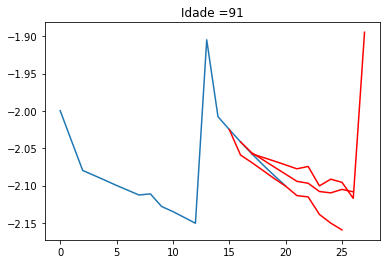

7/7 [==============================] - 0s 3ms/step - loss: 0.0360 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0299 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0246 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0118 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0050 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0040 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0419 - accuracy: 0.2857    


7/7 [==============================] - 0s 4ms/step - loss: 0.0021 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.7143    
t+1 RMSE: 0.010394
t+2 RMSE: 0.011732
t+3 RMSE: 0.155452
t+4 RMSE: 0.190516
t+5 RMSE: 0.218136
t+6 RMSE: 0.171510
t+7 RMSE: 0.159261
t+8 RMSE: 0.152572
t+9 RMSE: 0.143800
t+10 RMSE: 0.136063


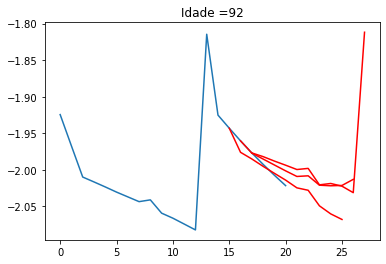

7/7 [==============================] - 0s 2ms/step - loss: 0.0349 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0265 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0223 - accuracy: 0.5714


7/7 [==============================] - 0s 4ms/step - loss: 0.0156 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0121 - accuracy: 0.5714    


7/7 [==============================] - 0s 3ms/step - loss: 0.0059 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0046 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0041 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 0.8571
t+1 RMSE: 0.011880
t+2 RMSE: 0.015470
t+3 RMSE: 0.165668
t+4 RMSE: 0.205935
t+5 RMSE: 0.240077
t+6 RMSE: 0.186849
t+7 RMSE: 0.180852
t+8 RMSE: 0.176482
t+9 RMSE: 0.161696
t+10 RMSE: 0.174367


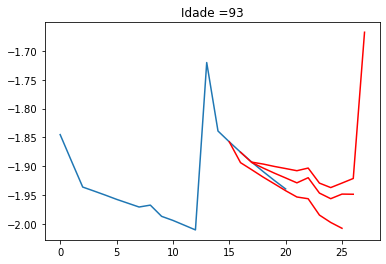

7/7 [==============================] - 0s 3ms/step - loss: 0.0377 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0342 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0241 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0057 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0287 - accuracy: 0.4286    


7/7 [==============================] - 0s 3ms/step - loss: 0.0035 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 9.6580e-04 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.8571
t+1 RMSE: 0.012599
t+2 RMSE: 0.014726
t+3 RMSE: 0.182538
t+4 RMSE: 0.221506
t+5 RMSE: 0.257655
t+6 RMSE: 0.209533
t+7 RMSE: 0.193872
t+8 RMSE: 0.185687
t+9 RMSE: 0.169857
t+10 RMSE: 0.177866


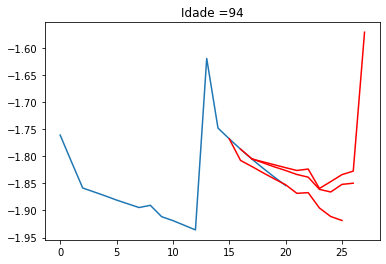

7/7 [==============================] - 0s 2ms/step - loss: 0.0362 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0298 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0253 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0112 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0091 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0065 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0034 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0017 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 0.7143    
t+1 RMSE: 0.012841
t+2 RMSE: 0.014839
t+3 RMSE: 0.199526
t+4 RMSE: 0.242862
t+5 RMSE: 0.280220
t+6 RMSE: 0.225143
t+7 RMSE: 0.208950
t+8 RMSE: 0.194494
t+9 RMSE: 0.180266
t+10 RMSE: 0.175611


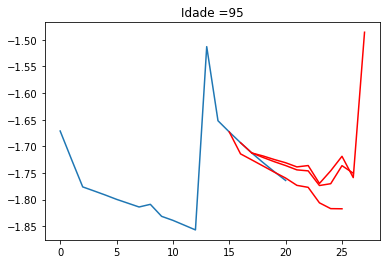

7/7 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0267 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0203 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0157 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0090 - accuracy: 0.7143    


7/7 [==============================] - 0s 4ms/step - loss: 0.0048 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0065 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0118 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 0.8571    


7/7 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.8571
t+1 RMSE: 0.012951
t+2 RMSE: 0.014157
t+3 RMSE: 0.216759
t+4 RMSE: 0.265650
t+5 RMSE: 0.301573
t+6 RMSE: 0.235905
t+7 RMSE: 0.217455
t+8 RMSE: 0.203879
t+9 RMSE: 0.193708
t+10 RMSE: 0.190566


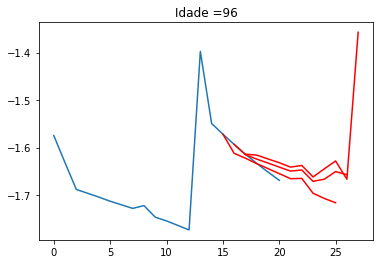

7/7 [==============================] - 0s 2ms/step - loss: 0.0353 - accuracy: 0.4286


7/7 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0223 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0146 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0237 - accuracy: 0.4286    


7/7 [==============================] - 0s 3ms/step - loss: 0.0042 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 0.7143    
t+1 RMSE: 0.014684
t+2 RMSE: 0.018658
t+3 RMSE: 0.237626
t+4 RMSE: 0.290499
t+5 RMSE: 0.338949
t+6 RMSE: 0.265116
t+7 RMSE: 0.249351
t+8 RMSE: 0.233605
t+9 RMSE: 0.223569
t+10 RMSE: 0.222506


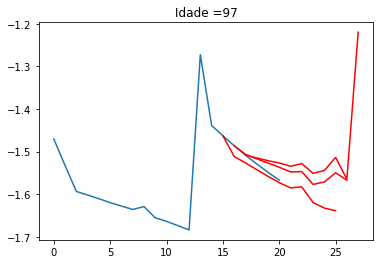

7/7 [==============================] - 0s 4ms/step - loss: 0.0328 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0263 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0178 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0109 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0043 - accuracy: 0.7143    


7/7 [==============================] - 0s 4ms/step - loss: 0.0041 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0060 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 0.8571    


7/7 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 0.8571    


7/7 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 0.8571
t+1 RMSE: 0.016535
t+2 RMSE: 0.018919
t+3 RMSE: 0.259264
t+4 RMSE: 0.317215
t+5 RMSE: 0.364446
t+6 RMSE: 0.287475
t+7 RMSE: 0.268597
t+8 RMSE: 0.249566
t+9 RMSE: 0.240971
t+10 RMSE: 0.250357


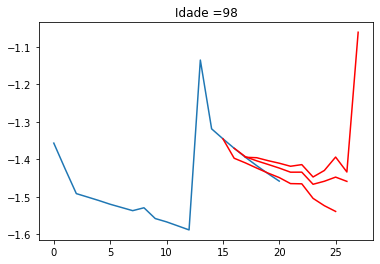

7/7 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.4286


7/7 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0207 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0088 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0058 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0032 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 0.7143    


7/7 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0316 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000
t+1 RMSE: 0.018582
t+2 RMSE: 0.021351
t+3 RMSE: 0.294786
t+4 RMSE: 0.356430
t+5 RMSE: 0.409215
t+6 RMSE: 0.325043
t+7 RMSE: 0.304920
t+8 RMSE: 0.289402
t+9 RMSE: 0.264929
t+10 RMSE: 0.256457


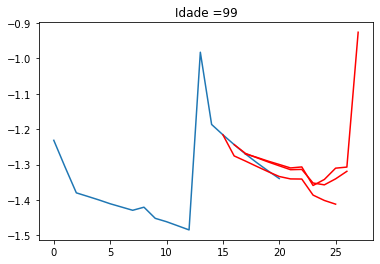

7/7 [==============================] - 0s 3ms/step - loss: 0.0324 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0277 - accuracy: 0.5714


7/7 [==============================] - 0s 4ms/step - loss: 0.0184 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0247 - accuracy: 0.2857


7/7 [==============================] - 0s 4ms/step - loss: 0.0080 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0038 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0021 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000
t+1 RMSE: 0.021116
t+2 RMSE: 0.024087
t+3 RMSE: 0.317134
t+4 RMSE: 0.389292
t+5 RMSE: 0.444477
t+6 RMSE: 0.358245
t+7 RMSE: 0.321042
t+8 RMSE: 0.293283
t+9 RMSE: 0.283941
t+10 RMSE: 0.295256


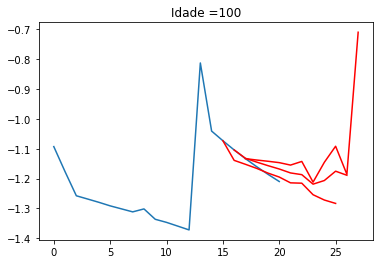

7/7 [==============================] - 0s 3ms/step - loss: 0.0364 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0324 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 0.0235 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0113 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0048 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0037 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0015 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 0.8571
t+1 RMSE: 0.023405
t+2 RMSE: 0.027155
t+3 RMSE: 0.355957
t+4 RMSE: 0.436663
t+5 RMSE: 0.503607
t+6 RMSE: 0.389945
t+7 RMSE: 0.363321
t+8 RMSE: 0.339984
t+9 RMSE: 0.317430
t+10 RMSE: 0.344775


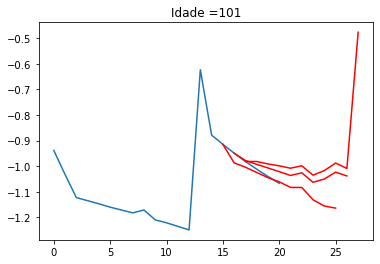

7/7 [==============================] - 0s 2ms/step - loss: 0.0363 - accuracy: 0.4286


7/7 [==============================] - 0s 2ms/step - loss: 0.0271 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0228 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0088 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0054 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0036 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0020 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 8.9892e-04 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 9.9545e-04 - accuracy: 0.8571
t+1 RMSE: 0.022802
t+2 RMSE: 0.027725
t+3 RMSE: 0.400023
t+4 RMSE: 0.479538
t+5 RMSE: 0.557005
t+6 RMSE: 0.453447
t+7 RMSE: 0.403861
t+8 RMSE: 0.377638
t+9 RMSE: 0.352903
t+10 RMSE: 0.377552


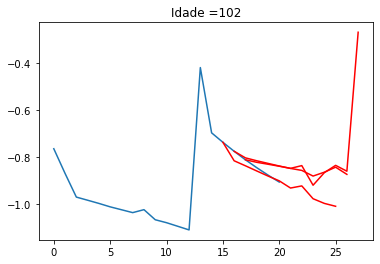

7/7 [==============================] - 0s 2ms/step - loss: 0.0376 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0274 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0121 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0076 - accuracy: 0.8571


7/7 [==============================] - 0s 5ms/step - loss: 0.0056 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0032 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0012 - accuracy: 0.8571    


7/7 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0011 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 9.5169e-04 - accuracy: 0.8571
t+1 RMSE: 0.028257
t+2 RMSE: 0.031407
t+3 RMSE: 0.434151
t+4 RMSE: 0.533654
t+5 RMSE: 0.614373
t+6 RMSE: 0.522410
t+7 RMSE: 0.472980
t+8 RMSE: 0.432175
t+9 RMSE: 0.430455
t+10 RMSE: 0.385326


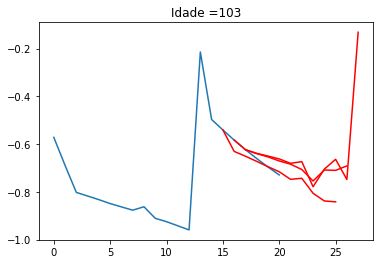

7/7 [==============================] - 0s 3ms/step - loss: 0.0398 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0285 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0086 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0056 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0034 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0024 - accuracy: 0.7143    


7/7 [==============================] - 0s 4ms/step - loss: 0.0017 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0010 - accuracy: 0.8571    


7/7 [==============================] - 0s 4ms/step - loss: 0.0011 - accuracy: 0.8571
t+1 RMSE: 0.028080
t+2 RMSE: 0.033020
t+3 RMSE: 0.420029
t+4 RMSE: 0.529485
t+5 RMSE: 0.628584
t+6 RMSE: 0.569287
t+7 RMSE: 0.520006
t+8 RMSE: 0.479810
t+9 RMSE: 0.445598
t+10 RMSE: 0.430987


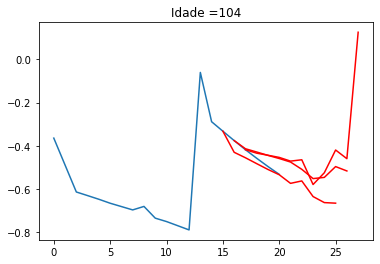

7/7 [==============================] - 0s 3ms/step - loss: 0.0471 - accuracy: 0.4286


7/7 [==============================] - 0s 3ms/step - loss: 0.0236 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0072 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0045 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0036 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0014 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0011 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 9.5948e-04 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 8.8033e-04 - accuracy: 1.0000
t+1 RMSE: 0.019466
t+2 RMSE: 0.018468
t+3 RMSE: 0.366869
t+4 RMSE: 0.483655
t+5 RMSE: 0.580253
t+6 RMSE: 0.578399
t+7 RMSE: 0.537679
t+8 RMSE: 0.475191
t+9 RMSE: 0.441079
t+10 RMSE: 0.358317


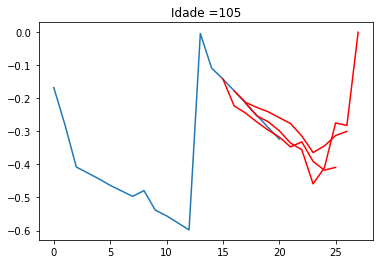

7/7 [==============================] - 0s 2ms/step - loss: 0.0361 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 0.0177 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0077 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0049 - accuracy: 0.7143


7/7 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 0.8571


7/7 [==============================] - 0s 4ms/step - loss: 0.0021 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000


7/7 [==============================] - 0s 8ms/step - loss: 0.0016 - accuracy: 0.8571
t+1 RMSE: 0.009474
t+2 RMSE: 0.013615
t+3 RMSE: 0.233359
t+4 RMSE: 0.325454
t+5 RMSE: 0.412844
t+6 RMSE: 0.432771
t+7 RMSE: 0.427467
t+8 RMSE: 0.421808
t+9 RMSE: 0.400905
t+10 RMSE: 0.332635


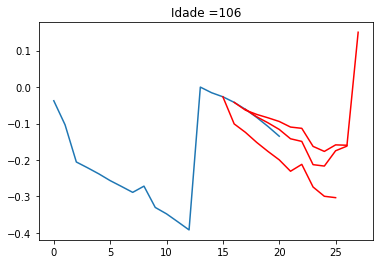

7/7 [==============================] - 0s 3ms/step - loss: 0.0416 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 0.0162 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 0.0078 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0040 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0034 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0013 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0018 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0013 - accuracy: 1.0000
t+1 RMSE: 0.006979
t+2 RMSE: 0.012528
t+3 RMSE: 0.113154
t+4 RMSE: 0.158803
t+5 RMSE: 0.190706
t+6 RMSE: 0.208448
t+7 RMSE: 0.219559
t+8 RMSE: 0.238335
t+9 RMSE: 0.253024
t+10 RMSE: 0.212932


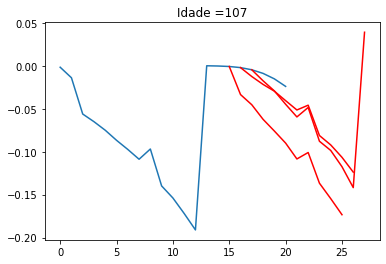

7/7 [==============================] - 0s 4ms/step - loss: 0.0432 - accuracy: 0.4286


7/7 [==============================] - 0s 5ms/step - loss: 0.0173 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0055 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0040 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0019 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0023 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0014 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0018 - accuracy: 1.0000


7/7 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000
t+1 RMSE: 0.007606
t+2 RMSE: 0.013235
t+3 RMSE: 0.028357
t+4 RMSE: 0.032961
t+5 RMSE: 0.032563
t+6 RMSE: 0.036923
t+7 RMSE: 0.041118
t+8 RMSE: 0.048768
t+9 RMSE: 0.056567
t+10 RMSE: 0.045212


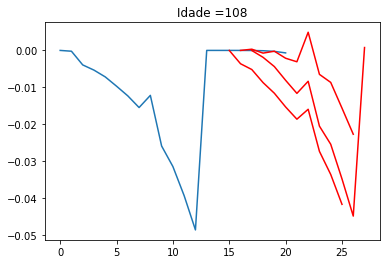

7/7 [==============================] - 0s 2ms/step - loss: 0.0407 - accuracy: 0.2857


7/7 [==============================] - 0s 2ms/step - loss: 0.0151 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0053 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0051 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0032 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0023 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0021 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.8571    


7/7 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 1.0000
t+1 RMSE: 0.000571
t+2 RMSE: 0.001259
t+3 RMSE: 0.001730
t+4 RMSE: 0.001838
t+5 RMSE: 0.001088
t+6 RMSE: 0.001401
t+7 RMSE: 0.001711
t+8 RMSE: 0.002289
t+9 RMSE: 0.002977
t+10 RMSE: 0.002402


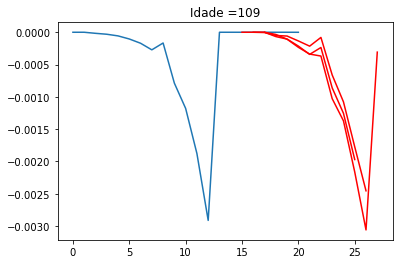

7/7 [==============================] - 0s 2ms/step - loss: 0.0312 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 0.0148 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0053 - accuracy: 0.7143    


7/7 [==============================] - 0s 2ms/step - loss: 0.0029 - accuracy: 0.8571


7/7 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0022 - accuracy: 0.7143    


7/7 [==============================] - 0s 3ms/step - loss: 0.0019 - accuracy: 1.0000


7/7 [==============================] - 0s 3ms/step - loss: 0.0021 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0016 - accuracy: 0.8571    


7/7 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 0.8571    


7/7 [==============================] - 0s 2ms/step - loss: 8.0494e-04 - accuracy: 0.7143
t+1 RMSE: 0.000001
t+2 RMSE: 0.000005
t+3 RMSE: 0.000005
t+4 RMSE: 0.000005
t+5 RMSE: 0.000001
t+6 RMSE: 0.000001
t+7 RMSE: 0.000002
t+8 RMSE: 0.000003
t+9 RMSE: 0.000006
t+10 RMSE: 0.000005


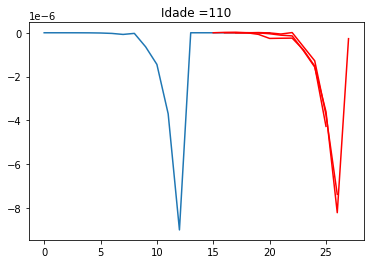

7/7 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 0.0239 - accuracy: 0.5714    


7/7 [==============================] - 0s 4ms/step - loss: 0.0131 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0065 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0044 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0031 - accuracy: 0.8571


7/7 [==============================] - 0s 3ms/step - loss: 0.0030 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0017 - accuracy: 1.0000


7/7 [==============================] - 0s 4ms/step - loss: 0.0020 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 0.0012 - accuracy: 0.8571
t+1 RMSE: 0.000000
t+2 RMSE: 0.000000
t+3 RMSE: 0.000000
t+4 RMSE: 0.000000
t+5 RMSE: 0.000000
t+6 RMSE: 0.000000
t+7 RMSE: 0.000000
t+8 RMSE: 0.000000
t+9 RMSE: 0.000000
t+10 RMSE: 0.000000


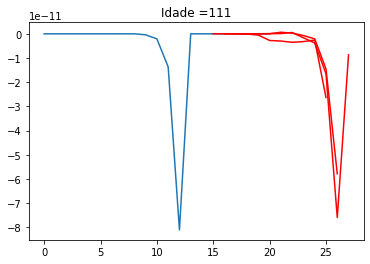

7/7 [==============================] - 0s 4ms/step - loss: 0.0047 - accuracy: 0.4286


7/7 [==============================] - 0s 4ms/step - loss: 5.1633e-04 - accuracy: 0.7143


7/7 [==============================] - 0s 4ms/step - loss: 1.9846e-04 - accuracy: 0.7143


7/7 [==============================] - 0s 5ms/step - loss: 2.5671e-04 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 5.2065e-05 - accuracy: 0.7143


7/7 [==============================] - 0s 3ms/step - loss: 4.4829e-05 - accuracy: 0.1429


7/7 [==============================] - 0s 4ms/step - loss: 1.0619e-05 - accuracy: 0.5714


7/7 [==============================] - 0s 2ms/step - loss: 1.3855e-05 - accuracy: 0.5714


7/7 [==============================] - 0s 3ms/step - loss: 7.4173e-06 - accuracy: 0.1429


7/7 [==============================] - 0s 4ms/step - loss: 1.8738e-06 - accuracy: 0.2857


7/7 [==============================] - 0s 3ms/step - loss: 4.1829e-06 - accuracy: 0.1429
t+1 RMSE: 0.003734
t+2 RMSE: 0.006592
t+3 RMSE: 0.009900
t+4 RMSE: 0.012614
t+5 RMSE: 0.015560
t+6 RMSE: 0.018669
t+7 RMSE: 0.022212
t+8 RMSE: 0.025689
t+9 RMSE: 0.028931
t+10 RMSE: 0.032319


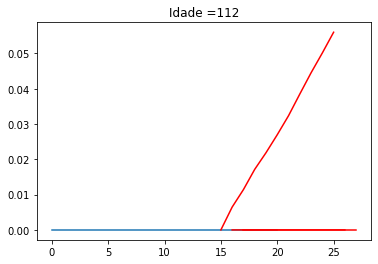

7/7 [==============================] - 0s 4ms/step - loss: 0.0069 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 9.7633e-04 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 2ms/step - loss: 3.3285e-04 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 3ms/step - loss: 1.1593e-04 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 8.7700e-05 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 3ms/step - loss: 3.0433e-05 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 3ms/step - loss: 2.3904e-05 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 2ms/step - loss: 1.4750e-05 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 1.1558e-05 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 1.2157e-05 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 5ms/step - loss: 8.3548e-06 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 2ms/step - loss: 3.8872e-06 - accuracy: 0.0000e+00
t+1 RMSE: 0.002696
t+2 RMSE: 0.005551
t+3 RMSE: 0.008468
t+4 RMSE: 0.012215
t+5 RMSE: 0.014941
t+6 RMSE: 0.017679
t+7 RMSE: 0.020538
t+8 RMSE: 0.024636
t+9 RMSE: 0.027243
t+10 RMSE: 0.030372


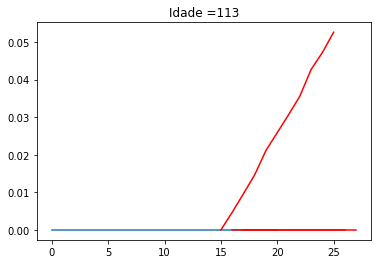

7/7 [==============================] - 0s 3ms/step - loss: 0.0069 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 9.1339e-04 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 3ms/step - loss: 2.2869e-04 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 2ms/step - loss: 1.5086e-04 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 5ms/step - loss: 3.9867e-05 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 5ms/step - loss: 2.9461e-05 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 5ms/step - loss: 3.7533e-05 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 2.1504e-05 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 5ms/step - loss: 1.4518e-05 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 6.5799e-06 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 5ms/step - loss: 1.6051e-06 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 3ms/step - loss: 6.2888e-06 - accuracy: 0.0000e+00
t+1 RMSE: 0.002754
t+2 RMSE: 0.005329
t+3 RMSE: 0.007880
t+4 RMSE: 0.011039
t+5 RMSE: 0.014465
t+6 RMSE: 0.018108
t+7 RMSE: 0.021940
t+8 RMSE: 0.025582
t+9 RMSE: 0.028475
t+10 RMSE: 0.031105


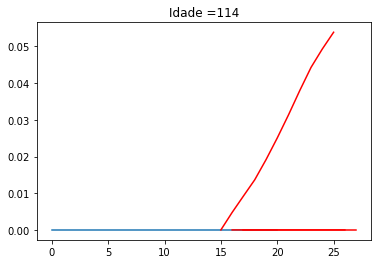

7/7 [==============================] - 0s 2ms/step - loss: 0.0061 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 0.0013 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 3ms/step - loss: 2.8299e-04 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 2.0936e-04 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 3ms/step - loss: 1.7312e-04 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 5ms/step - loss: 4.4302e-05 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 2.9417e-05 - accuracy: 0.1429


7/7 [==============================] - 0s 2ms/step - loss: 9.3034e-06 - accuracy: 0.1429


7/7 [==============================] - 0s 4ms/step - loss: 8.3330e-06 - accuracy: 0.1429


7/7 [==============================] - 0s 3ms/step - loss: 4.0646e-06 - accuracy: 0.1429


7/7 [==============================] - 0s 4ms/step - loss: 7.9581e-07 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 3.5329e-06 - accuracy: 0.1429
t+1 RMSE: 0.003251
t+2 RMSE: 0.006570
t+3 RMSE: 0.009401
t+4 RMSE: 0.012239
t+5 RMSE: 0.015044
t+6 RMSE: 0.017614
t+7 RMSE: 0.020562
t+8 RMSE: 0.023186
t+9 RMSE: 0.026619
t+10 RMSE: 0.030622


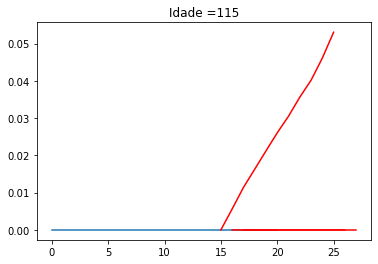

7/7 [==============================] - 0s 2ms/step - loss: 0.0070 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 9.4764e-04 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 5ms/step - loss: 3.1917e-04 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 8.5130e-05 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 1.3946e-04 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 3ms/step - loss: 5.5947e-05 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 3.1817e-05 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 4ms/step - loss: 1.4466e-05 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 3ms/step - loss: 7.1798e-05 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 3ms/step - loss: 1.0602e-05 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 6ms/step - loss: 3.1513e-06 - accuracy: 0.0000e+00


7/7 [==============================] - 0s 3ms/step - loss: 3.1169e-06 - accuracy: 0.0000e+00
t+1 RMSE: 0.002438
t+2 RMSE: 0.005283
t+3 RMSE: 0.008835
t+4 RMSE: 0.012026
t+5 RMSE: 0.016156
t+6 RMSE: 0.018921
t+7 RMSE: 0.021741
t+8 RMSE: 0.025250
t+9 RMSE: 0.027734
t+10 RMSE: 0.030618


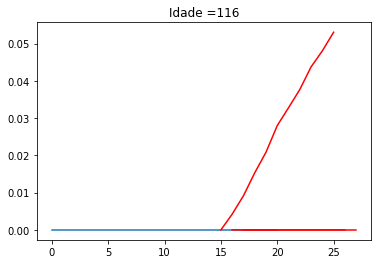


Tempo de processamento:
01:46:13.44



In [14]:
#loop na idade de 0 até 117 para alterar a serie = df_lstm[df_lstm['idade']==0]['logqx_prob']
forecasts_res = []
w_max = max(df_dados['idade'])
# w_max = max(w) # definir maior idade nas tábuas
# inicio do cronometro do processamento
start = time.time()
#n_lag = w_max+1 # 113 # 1 # 113 corresponde a uma tábua(idade de 0 a 113. No caso um ano.
n_lag = 1 #21 # Tamanho da série
n_seq = 10 # 20 #5 # 3 # número de anos adiante
# n_test = w_max+1 #113 #791 # Agora simulacao com 33 % teste = 791 (7 anos) / 113 => corresponde ao ano de 2018 como teste # 10
n_test = 3 # últimos 3 anos
n_epochs = 1000 #30 #60 # 500 # 1500
n_batch = 1
n_neurons = 50 #50

for x in range(0, w_max+1): #w_max+1
    # Série para cada idade ao longo dos anos de 1998 a 2018
    series = df_lstm[df_lstm['idade']==x]['logqx_prob']

    #prepare data
    scaler, train, test = prepare_data(series, n_test, n_lag, n_seq)

    #fit model
    model = fit_lstm(train, n_lag, n_seq, n_batch, n_epochs, n_neurons)

    #forecasts
    forecasts = make_forecasts(model, n_batch, train, test, n_lag, n_seq)

    #inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler, n_test+2)
    actual = [row[n_lag:] for row in test]
    actual = inverse_transform(series, actual, scaler, n_test+2)
    
    forecasts_res.append(forecasts)
    #evaluate forecasts
    evaluate_forecasts(actual, forecasts, n_lag, n_seq)
#    if x == 0:
    #plot forecasts. fazer como exemplo para idade = 0
    plot_forecasts(series, forecasts, n_test+2, x)

# fim do cronometro do processamento

end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print()
print('Tempo de processamento:')
print('{:0>2}:{:0>2}:{:05.2f}'.format(int(hours), int(minutes), seconds))
print()

In [15]:
pd.DataFrame(forecasts_res)

,0,1,2
0,"[-4.244036331128549, -4.27406289364047, -4.304...","[-4.270805380632524, -4.299107351665739, -4.32...","[-4.310565902920427, -4.340186261640849, -4.37..."
1,"[-7.0585784938175715, -7.100757292284492, -7.1...","[-7.0320812365707654, -7.071906184285571, -7.1...","[-7.048440107582186, -7.083288942901467, -7.10..."
2,"[-7.46939918193427, -7.510834129335556, -7.551...","[-7.467252770367171, -7.503291917893197, -7.53...","[-7.500156636631818, -7.541468686706157, -7.58..."
3,"[-7.741386413079872, -7.754936553974821, -7.82...","[-7.708683077070943, -7.778095763001672, -7.81...","[-7.8143310694573405, -7.8705083018718245, -7...."
4,"[-7.918359362613534, -7.951076221745585, -8.00...","[-7.919393389009005, -7.980080010823971, -7.96...","[-7.979482291720124, -7.965335483185263, -8.10..."
...,...,...,...
112,"[0.006467550992965698, 0.011417210102081299, 0...","[9.160604719227194e-08, 1.1793931875558883e-07...","[1.9784025806490746e-10, 2.3164512322204622e-1..."
113,"[0.0046694278717041016, 0.00961485505104065, 0...","[2.153974243412904e-08, 5.199640362718583e-08,...","[2.7759747625588638e-11, 7.172070749794646e-11..."
114,"[0.004770547151565552, 0.009229272603988647, 0...","[3.099593826050295e-08, 5.2523441596008524e-08...","[5.672966610359431e-11, 8.753600969080289e-11,..."
115,"[0.005630552768707275, 0.011380225419998169, 0...","[5.531444458029e-08, 1.151535116150626e-07, 1....","[1.206870714476338e-10, 2.58905924477304e-10, ..."


In [16]:
df_forecast_res = pd.DataFrame(forecasts_res)

In [17]:
df_forecast_res.to_csv(pasta_resultados + '/' + 'lstm_previsao.csv')

In [18]:
df_forecast_res_exp = pd.DataFrame(np.exp(forecasts_res))

ValueError: Must pass 2-d input. shape=(117, 3, 10)

In [19]:
df_forecast_res_exp = pd.DataFrame(np.exp(forecasts_res[0]))

In [20]:
df_forecast_res_exp.head()

,0,1,2,3,4,5,6,7,8,9
0,0.014350,0.013925,0.013510,0.013093,0.012669,0.012262,0.011850,0.011434,0.011054,0.010697
1,0.013971,0.013581,0.013203,0.012832,0.012465,0.012085,0.011735,0.011396,0.011076,0.010675
2,0.013426,0.013034,0.012648,0.012275,0.011893,0.011524,0.011187,0.010852,0.010518,0.007865


In [67]:
pd.DataFrame(forecasts_res[0]).head()

,0,1,2,3,4,5,6,7,8,9
0,-4.173689,-4.203792,-4.234099,-4.265386,-4.298205,-4.330330,-4.364514,-4.400125,-4.435389,-4.470881
1,-4.185381,-4.213551,-4.241841,-4.270204,-4.299232,-4.328189,-4.357284,-4.386963,-4.415869,-4.452856
2,-4.226931,-4.256237,-4.287195,-4.317109,-4.349042,-4.380405,-4.410583,-4.438970,-4.470616,-4.759268
3,-4.271158,-4.302290,-4.331749,-4.363158,-4.396013,-4.426009,-4.459826,-4.491482,-4.781810,-4.811332
4,-4.314061,-4.342360,-4.373070,-4.405620,-4.436416,-4.468227,-4.504083,-4.794800,-4.824750,-4.853039


In [68]:
pd.DataFrame(forecasts_res[0]).shape

(5, 10)

In [17]:
# anos do intervalo da previsão
ano_inicio = 2019
anos = np.arange(ano_inicio, ano_inicio+n_seq)
anos

array([2019, 2020, 2021, 2022, 2023, 2024, 2025, 2026, 2027, 2028])

In [19]:
df_forecast_res = pd.DataFrame(forecasts_res)

In [20]:
df_forecast_res.head()

,0,1,2,3,4
0,"[-4.173494799676609, -4.20362714739449, -4.234...","[-4.186509730778168, -4.214852333552669, -4.24...","[-4.227484722908806, -4.256912232663702, -4.28...","[-4.271887236600165, -4.301915823807363, -4.33...","[-4.313131927581491, -4.342243396745982, -4.37..."
1,"[-6.945322637946846, -6.979661250056268, -7.01...","[-6.963615971795691, -6.996169193826092, -7.03...","[-7.01251652724934, -7.055794766916756, -7.087...","[-7.025777222096612, -7.058148970335414, -7.12...","[-7.029739962397192, -7.074671903131579, -7.11..."
2,"[-7.386655381931165, -7.423065452886918, -7.45...","[-7.410327399983953, -7.445423374786924, -7.47...","[-7.442301017971906, -7.479722456814918, -7.51...","[-7.456967500898148, -7.495154870602395, -7.53...","[-7.492419268286557, -7.528338383233876, -7.58..."
3,"[-7.66764873593112, -7.678904965994857, -7.750...","[-7.6615735156772296, -7.746536293470637, -7.7...","[-7.74835250477232, -7.785122986388578, -7.807...","[-7.728109225455753, -7.74122570251309, -7.795...","[-7.748856846111822, -7.801225833463478, -7.87..."
4,"[-7.865614811880439, -7.908577389074415, -7.96...","[-7.883411120600369, -7.929739780701068, -7.91...","[-7.903207131754731, -7.887493827473496, -7.96...","[-7.870236082457072, -7.95524830230332, -7.993...","[-7.994520752213211, -8.07829390325329, -8.135..."


In [25]:
df_forecast_res = pd.DataFrame(forcast_res[0])

In [26]:
df_forecast_res.head()

,0,1,2,3,4,5,6,7,8,9
0,-4.173495,-4.203627,-4.234238,-4.265570,-4.298489,-4.330444,-4.364701,-4.399531,-4.435431,-4.469808
1,-4.186510,-4.214852,-4.243661,-4.272796,-4.302798,-4.332520,-4.362070,-4.392385,-4.421200,-4.458813
2,-4.227485,-4.256912,-4.287702,-4.318103,-4.350817,-4.384800,-4.415975,-4.444559,-4.478395,-4.767001
3,-4.271887,-4.301916,-4.331085,-4.362636,-4.395189,-4.424971,-4.458190,-4.488724,-4.777387,-4.807770
4,-4.313132,-4.342243,-4.372337,-4.403344,-4.433008,-4.465238,-4.498635,-4.789522,-4.819142,-4.847426


In [ ]:
df_forecast_res = pd.DataFrame(forcast_res, columns=anos)

In [ ]:
forcast_res.to_csv('forescast_res.csv')